**Comprehensive EDA On Heart Data Analysis**


In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [95]:
df =pd.read_csv('heart_attack_prediction_dataset.csv')
pd.set_option('display.max_columns', None)
df.head()

,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,Male,208,158/88,72,0,0,1,0,0,4.168189,Average,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,Male,389,165/93,98,1,1,1,1,1,1.813242,Unhealthy,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,Female,324,174/99,72,1,0,0,0,0,2.078353,Healthy,1,1,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,Male,383,163/100,73,1,1,1,0,1,9.828130,Average,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,Male,318,91/88,93,1,1,1,1,0,5.804299,Unhealthy,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Patient ID                       8763 non-null   object 
 1   Age                              8763 non-null   int64  
 2   Sex                              8763 non-null   object 
 3   Cholesterol                      8763 non-null   int64  
 4   Blood Pressure                   8763 non-null   object 
 5   Heart Rate                       8763 non-null   int64  
 6   Diabetes                         8763 non-null   int64  
 7   Family History                   8763 non-null   int64  
 8   Smoking                          8763 non-null   int64  
 9   Obesity                          8763 non-null   int64  
 10  Alcohol Consumption              8763 non-null   int64  
 11  Exercise Hours Per Week          8763 non-null   float64
 12  Diet                

In [97]:
df.nunique()

Patient ID                         8763
Age                                  73
Sex                                   2
Cholesterol                         281
Blood Pressure                     3915
Heart Rate                           71
Diabetes                              2
Family History                        2
Smoking                               2
Obesity                               2
Alcohol Consumption                   2
Exercise Hours Per Week            8763
Diet                                  3
Previous Heart Problems               2
Medication Use                        2
Stress Level                         10
Sedentary Hours Per Day            8763
Income                             8615
BMI                                8763
Triglycerides                       771
Physical Activity Days Per Week       8
Sleep Hours Per Day                   7
Country                              20
Continent                             6
Hemisphere                            2


In [98]:
for columns in df.columns:
    unique_val = df[columns].unique()
    print(f"Unique values in {columns} are: {unique_val}")

Unique values in Patient ID are: ['BMW7812' 'CZE1114' 'BNI9906' ... 'XKA5925' 'EPE6801' 'ZWN9666']
Unique values in Age are: [67 21 84 66 54 90 20 43 73 71 77 60 88 69 38 50 45 36 48 40 79 63 27 25
 86 42 52 29 30 47 44 33 51 70 85 31 56 24 74 72 55 26 53 46 57 22 35 39
 80 65 83 82 28 19 75 18 34 37 89 32 49 23 59 62 64 61 76 41 87 81 58 78
 68]
Unique values in Sex are: ['Male' 'Female']
Unique values in Cholesterol are: [208 389 324 383 318 297 358 220 145 248 373 374 228 259 122 379 166 303
 340 294 359 202 133 159 271 273 328 154 135 197 321 375 360 263 201 347
 129 229 251 121 190 185 279 336 192 180 203 368 222 243 218 120 285 377
 369 311 139 266 153 339 329 333 398 124 183 163 362 390 200 396 255 209
 247 250 227 246 223 330 195 194 178 155 240 237 216 276 224 326 198 301
 314 304 334 213 254 230 316 277 388 206 384 205 261 308 338 382 291 168
 171 378 253 245 226 281 123 173 231 234 268 306 186 293 161 380 239 149
 320 219 335 265 126 307 270 225 193 148 296 136 364 353 252 2

**Data Cleaning**

In [99]:
# For reduce Redundancy we are dropping the Patient ID
df = df.drop(columns='Patient ID')
df.head()

,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,67,Male,208,158/88,72,0,0,1,0,0,4.168189,Average,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,21,Male,389,165/93,98,1,1,1,1,1,1.813242,Unhealthy,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,21,Female,324,174/99,72,1,0,0,0,0,2.078353,Healthy,1,1,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,84,Male,383,163/100,73,1,1,1,0,1,9.828130,Average,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,66,Male,318,91/88,93,1,1,1,1,0,5.804299,Unhealthy,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [100]:
# Splitting the Blood Pressure column into Systolic and Diastolic columns
df['Systolic'] = df['Blood Pressure'].apply(lambda x: int(x.split('/')[0]))
df['Diastolic'] = df['Blood Pressure'].apply(lambda x: int(x.split('/')[1]))
# df.head()

In [101]:
print(df.columns)   

Index(['Age', 'Sex', 'Cholesterol', 'Blood Pressure', 'Heart Rate', 'Diabetes',
       'Family History', 'Smoking', 'Obesity', 'Alcohol Consumption',
       'Exercise Hours Per Week', 'Diet', 'Previous Heart Problems',
       'Medication Use', 'Stress Level', 'Sedentary Hours Per Day', 'Income',
       'BMI', 'Triglycerides', 'Physical Activity Days Per Week',
       'Sleep Hours Per Day', 'Country', 'Continent', 'Hemisphere',
       'Heart Attack Risk', 'Systolic', 'Diastolic'],
      dtype='object')


In [102]:
new_order = ['Age', 'Sex', 'Cholesterol', 'Blood Pressure', 'Systolic', 'Diastolic', 'Heart Rate', 'Diabetes',
       'Family History', 'Smoking', 'Obesity', 'Alcohol Consumption',
       'Exercise Hours Per Week', 'Diet', 'Previous Heart Problems',
       'Medication Use', 'Stress Level', 'Sedentary Hours Per Day', 'Income',
       'BMI', 'Triglycerides', 'Physical Activity Days Per Week',
       'Sleep Hours Per Day', 'Country', 'Continent', 'Hemisphere',
       'Heart Attack Risk']
df = df[new_order]
df.head()

,Age,Sex,Cholesterol,Blood Pressure,Systolic,Diastolic,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,67,Male,208,158/88,158,88,72,0,0,1,0,0,4.168189,Average,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,21,Male,389,165/93,165,93,98,1,1,1,1,1,1.813242,Unhealthy,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,21,Female,324,174/99,174,99,72,1,0,0,0,0,2.078353,Healthy,1,1,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,84,Male,383,163/100,163,100,73,1,1,1,0,1,9.828130,Average,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,66,Male,318,91/88,91,88,93,1,1,1,1,0,5.804299,Unhealthy,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [103]:
# Now we will drop the Blood Pressure column and make new column name by BP_ratio
bp_index = df.columns.get_loc('Blood Pressure')
df = df.drop(columns='Blood Pressure')
df['BP_Ratio'] = df['Systolic']/df['Diastolic']

df.insert(bp_index+2, 'BP_Ratio', df.pop('BP_Ratio'))
df['BP_Ratio'] =df['BP_Ratio'].round(2)
df.head()


,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,67,Male,208,158,88,1.80,72,0,0,1,0,0,4.168189,Average,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,21,Male,389,165,93,1.77,98,1,1,1,1,1,1.813242,Unhealthy,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,21,Female,324,174,99,1.76,72,1,0,0,0,0,2.078353,Healthy,1,1,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,84,Male,383,163,100,1.63,73,1,1,1,0,1,9.828130,Average,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,66,Male,318,91,88,1.03,93,1,1,1,1,0,5.804299,Unhealthy,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [104]:
#Extract the rows and columns where the data missing
missing_values = df[df.isnull().any(axis=1)][df.columns[df.isnull().any(axis=0)]]
print(missing_values)   
# df.isnull().sum()


Empty DataFrame
Columns: []
Index: []


In [105]:
# Chesck for any duplicate rows
duplicate_rows = df[df.duplicated()]
print("Number of duplicate rows:", duplicate_rows.shape[0])
if duplicate_rows.shape[0] >0:
    print(duplicate_rows)
else:
    print("No duplicate rows found")

Number of duplicate rows: 0
No duplicate rows found


In [106]:
# For better understanding we will convert the Boolean values(0,1) to (No, Yes)
for column in df.columns:
    if set(df[column].unique()) == {0,1}:
        df[column] = df[column].replace({0:'No', 1:'Yes'})
df.head()

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,67,Male,208,158,88,1.80,72,No,No,Yes,No,No,4.168189,Average,No,No,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,No
1,21,Male,389,165,93,1.77,98,Yes,Yes,Yes,Yes,Yes,1.813242,Unhealthy,Yes,No,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,No
2,21,Female,324,174,99,1.76,72,Yes,No,No,No,No,2.078353,Healthy,Yes,Yes,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,No
3,84,Male,383,163,100,1.63,73,Yes,Yes,Yes,No,Yes,9.828130,Average,Yes,No,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,No
4,66,Male,318,91,88,1.03,93,Yes,Yes,Yes,Yes,No,5.804299,Unhealthy,Yes,No,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,No


**Data Analysis**

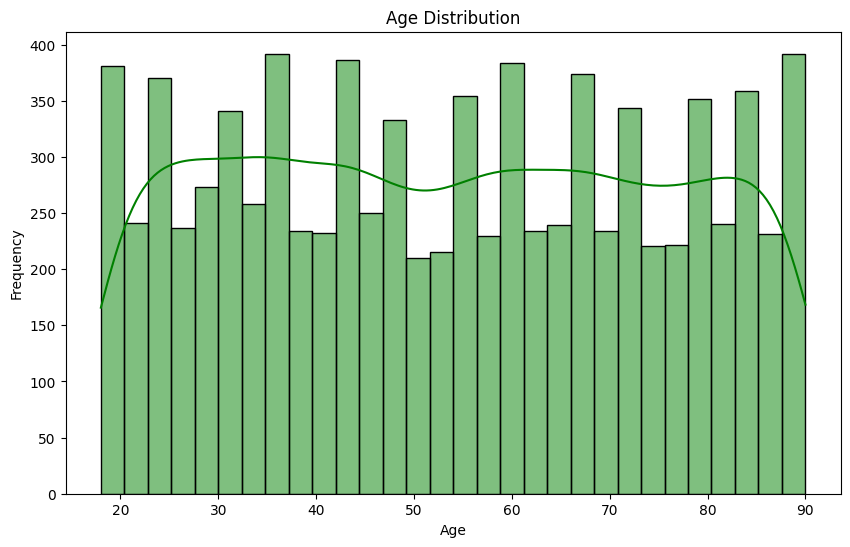

In [107]:
# Age Distribution
plt.figure(figsize=(10,6))
sns.histplot(df['Age'], kde=True, bins=30, color='green')
plt.title('Age Distribution')
plt.xlabel('Age')   
plt.ylabel('Frequency')
plt.show()

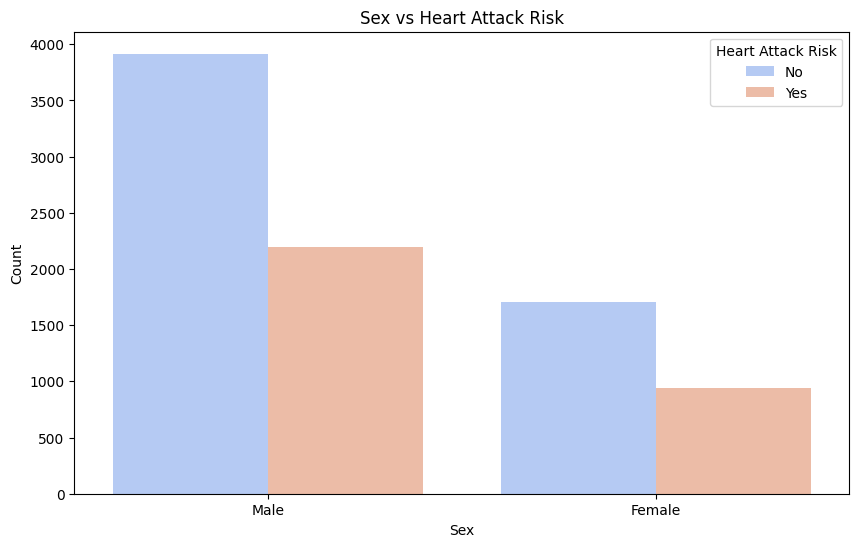

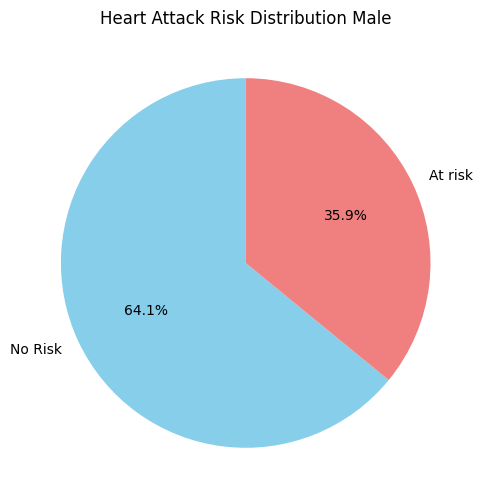

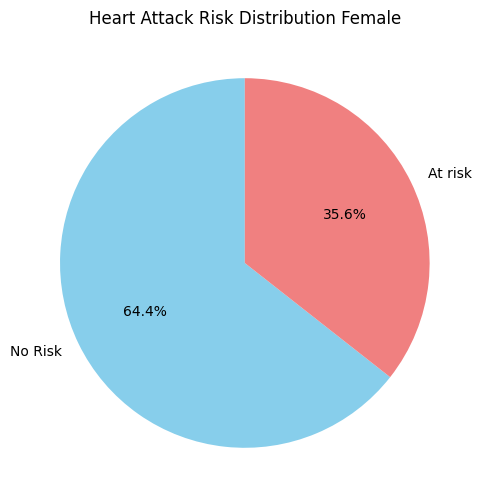

In [108]:
#Heart Risk by age and gender
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Sex', hue='Heart Attack Risk', palette='coolwarm')
plt.title('Sex vs Heart Attack Risk')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.show()

# Pie Chart for Heart Attack Risk
risk_by_sex = df.groupby(['Sex','Heart Attack Risk']).size().unstack(fill_value=0)
male_percentage = risk_by_sex.loc['Male']/risk_by_sex.loc['Male'].sum() * 100
female_percentage = risk_by_sex.loc['Female']/risk_by_sex.loc['Female'].sum() * 100

#Pie chart for Male
plt.figure(figsize=(10,6))
plt.pie(male_percentage, labels=['No Risk', 'At risk'],autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
plt.title('Heart Attack Risk Distribution Male')
plt.show()

#Pie chart for Female
plt.figure(figsize=(10,6))
plt.pie(female_percentage, labels=['No Risk', 'At risk'],autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
plt.title('Heart Attack Risk Distribution Female')
plt.show()

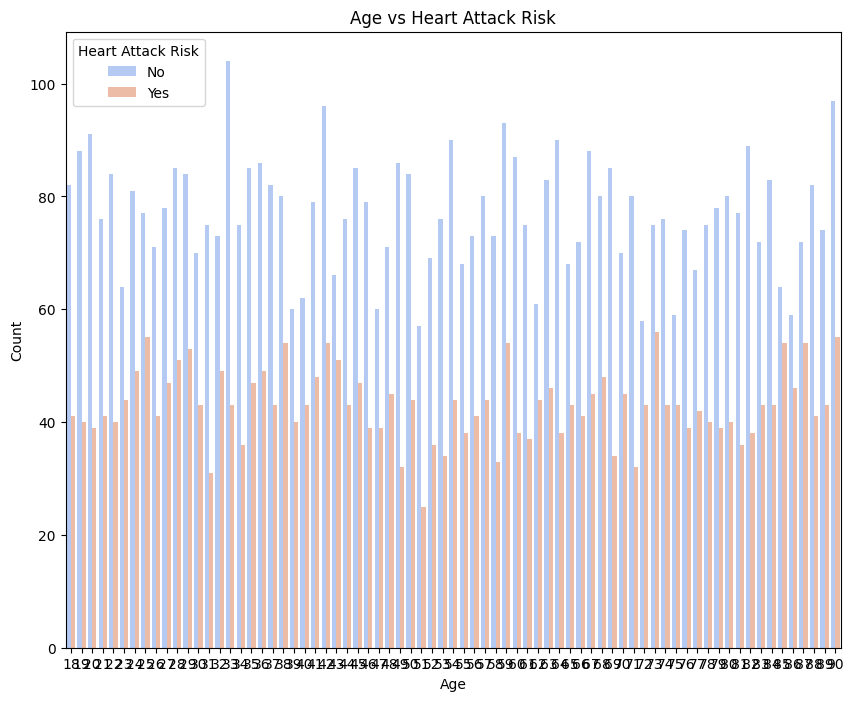

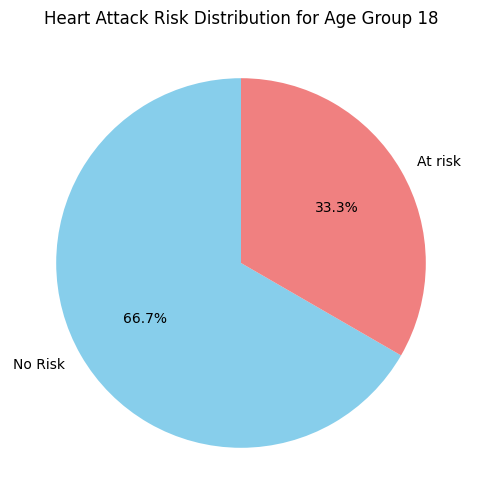

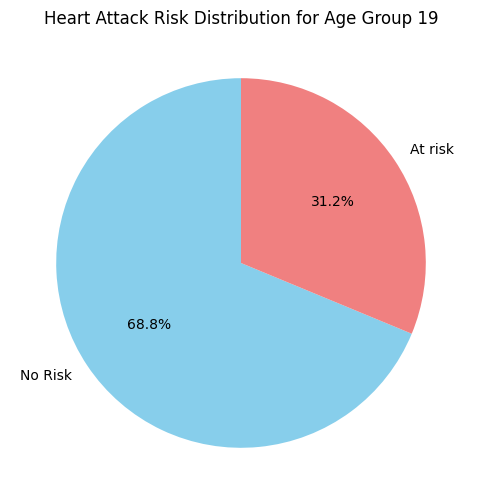

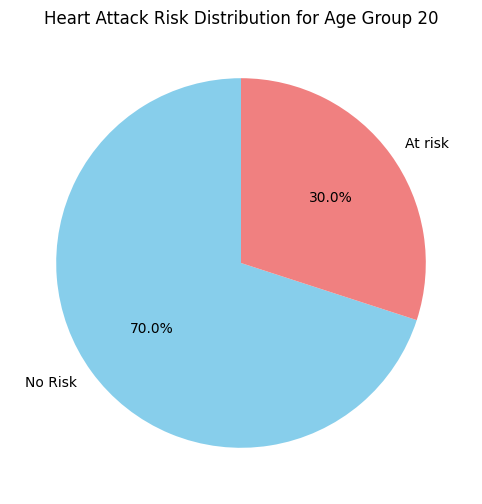

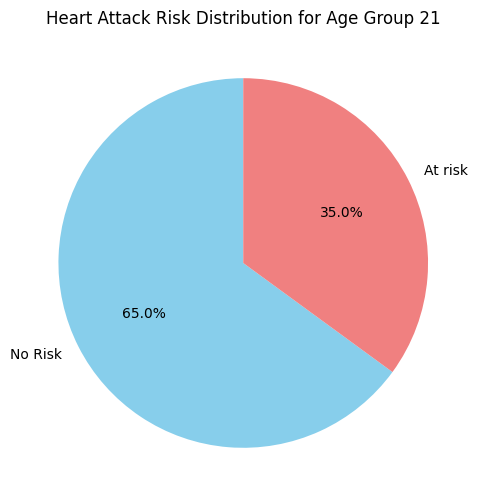

...

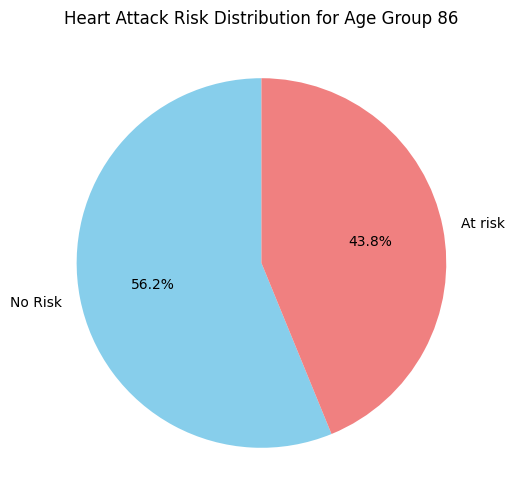

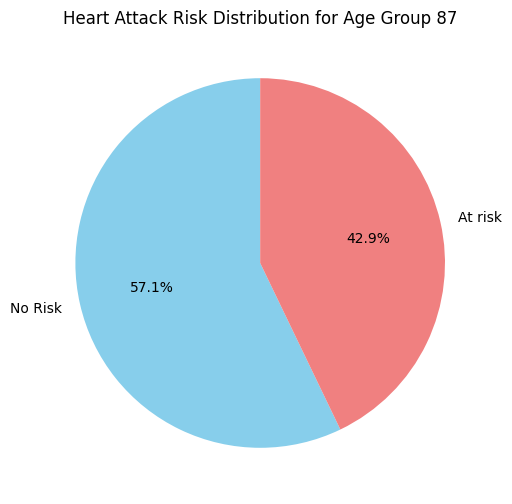

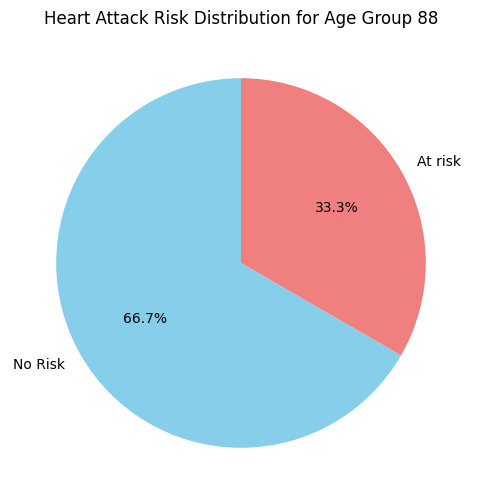

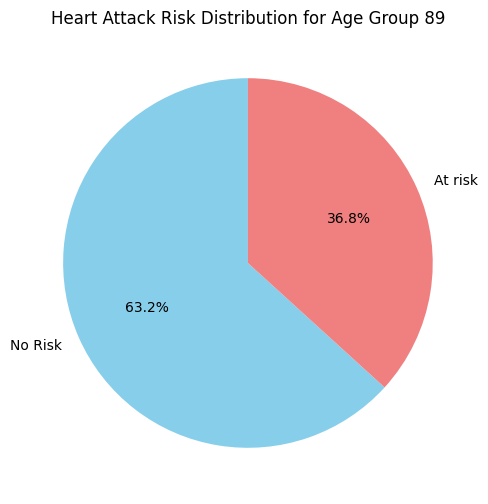

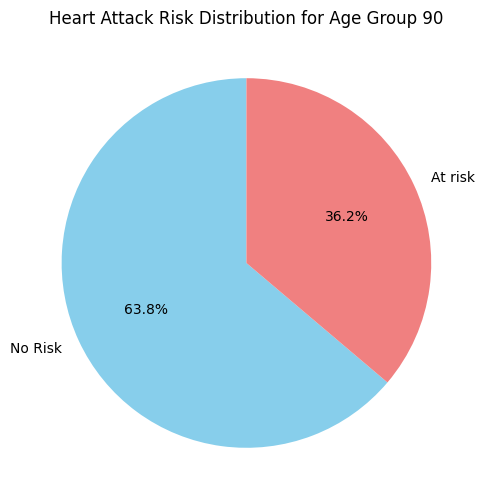

In [109]:
# Bar Plot for Age vs Heart Attack Risk
plt.figure(figsize=(10,8))
sns.countplot(data=df, x='Age', hue='Heart Attack Risk', palette='coolwarm')
plt.title('Age vs Heart Attack Risk')
plt.xlabel('Age')
plt.ylabel('Count')     
plt.show()

# Pie Chart Data
risk_by_age = df.groupby(['Age','Heart Attack Risk']).size().unstack(fill_value=0)
age_groups = risk_by_age.index
for age_group in age_groups:
    age_group_percentage = risk_by_age.loc[age_group]/risk_by_age.loc[age_group].sum() * 100
    plt.figure(figsize=(10,6))
    plt.pie(age_group_percentage, labels=['No Risk', 'At risk'],autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
    plt.title(f'Heart Attack Risk Distribution for Age Group {age_group}')
    plt.show()


Highest/ Lowest Risk of Heart Attack on specific Age

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\359090663.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=age_risk_percentages.index, y=age_risk_percentages['Yes'], palette='coolwarm')


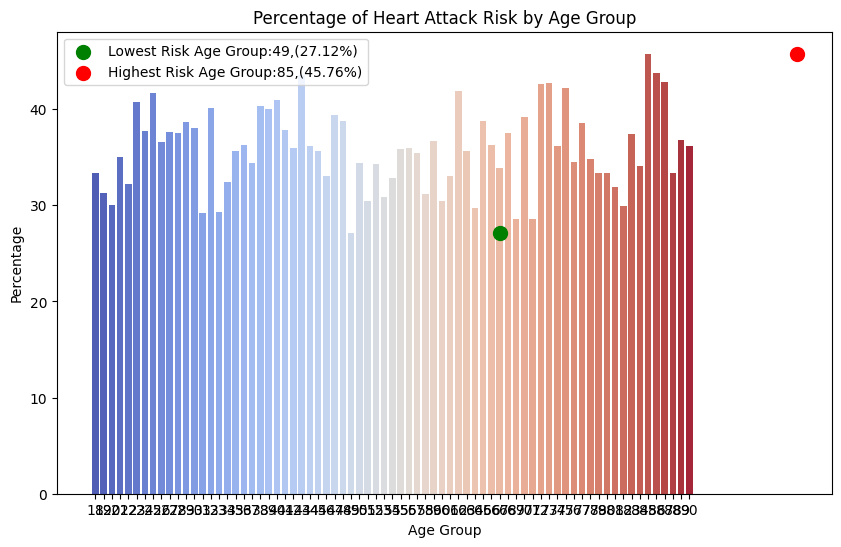

Age group with the lowest percentage is : 49 with 27.12%
Age group with the highest percentage is : 85 with 45.76%


In [110]:
#Calculate percentage of 'Yes' for each age group 
age_risk_percentages = risk_by_age.div(risk_by_age.sum(axis=1), axis=0)*100

#Find the age group with the lowest and highest percentage of "Yes"
lowest_risk_age = age_risk_percentages['Yes'].idxmin()
highest_risk_age = age_risk_percentages['Yes'].idxmax()

#Get the percentage for the lowest and highest risk age groups
lowest_risk_perentage = age_risk_percentages.loc[lowest_risk_age, 'Yes']    
highest_risk_percentage = age_risk_percentages.loc[highest_risk_age, 'Yes'] 

plt.figure(figsize=(10,6))
sns.barplot(x=age_risk_percentages.index, y=age_risk_percentages['Yes'], palette='coolwarm')

plt.scatter(lowest_risk_age, lowest_risk_perentage, color='Green', s=100, label=f"Lowest Risk Age Group:{lowest_risk_age},({lowest_risk_perentage:.2f}%)")
plt.scatter(highest_risk_age, highest_risk_percentage, color='Red', s=100, label=f"Highest Risk Age Group:{highest_risk_age},({highest_risk_percentage:.2f}%)")
plt.title('Percentage of Heart Attack Risk by Age Group')
plt.xlabel('Age Group') 
plt.ylabel('Percentage')
plt.legend()
plt.show()

print(f"Age group with the lowest percentage is : {lowest_risk_age} with {lowest_risk_perentage:.2f}%") 
print(f"Age group with the highest percentage is : {highest_risk_age} with {highest_risk_percentage:.2f}%") 

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\85846445.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=age_no_risk_percentage.index, y= age_no_risk_percentage, palette='coolwarm')


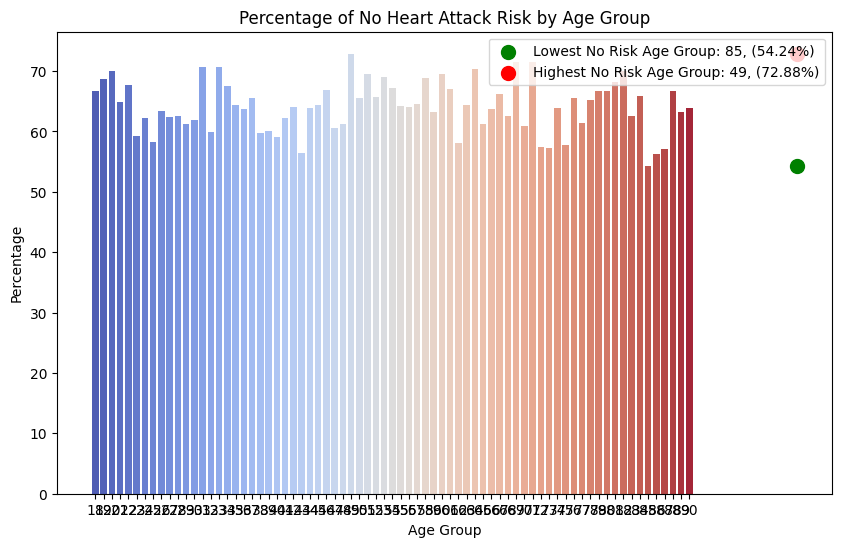

Age group with the lowest percentage is : 85 with 54.24%
Age group with the highest percentage is : 49 with 72.88%


In [111]:
# Calculate the percenatge of 'No'for each age group
age_no_risk_percentage = risk_by_age['No']/risk_by_age.sum(axis=1)*100
# Find the age group with the Lowest abd the Highest percentage of 'No' 
lowest_no_risk_age = age_no_risk_percentage.idxmin()
highest_no_risk_age = age_no_risk_percentage.idxmax()

plt.figure(figsize=(10,6))
sns.barplot(x=age_no_risk_percentage.index, y= age_no_risk_percentage, palette='coolwarm')

plt.scatter(lowest_no_risk_age, age_no_risk_percentage.loc[lowest_no_risk_age],color='Green', s=100, label=f"Lowest No Risk Age Group: {lowest_no_risk_age}, ({age_no_risk_percentage.loc[lowest_no_risk_age]:.2f}%)")  
plt.scatter(lowest_no_risk_age, age_no_risk_percentage.loc[highest_no_risk_age],color='Red', s=100, label=f"Highest No Risk Age Group: {highest_no_risk_age}, ({age_no_risk_percentage.loc[highest_no_risk_age]:.2f}%)")
plt.title('Percentage of No Heart Attack Risk by Age Group')
plt.xlabel('Age Group') 
plt.ylabel('Percentage')
plt.legend()
plt.show()

print(f"Age group with the lowest percentage is : {lowest_no_risk_age} with {age_no_risk_percentage.loc[lowest_no_risk_age]:.2f}%")
print(f"Age group with the highest percentage is : {highest_no_risk_age} with {age_no_risk_percentage.loc[highest_no_risk_age]:.2f}%")

Age
49    45.762712
71    42.857143
69    42.857143
31    41.509434
33    41.496599
        ...    
73    14.503817
87    14.285714
43    12.820513
86    12.380952
85     8.474576
Length: 73, dtype: float64


C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\1801609765.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ranked_age_risk_score.index, y=ranked_age_risk_score, palette='coolwarm')


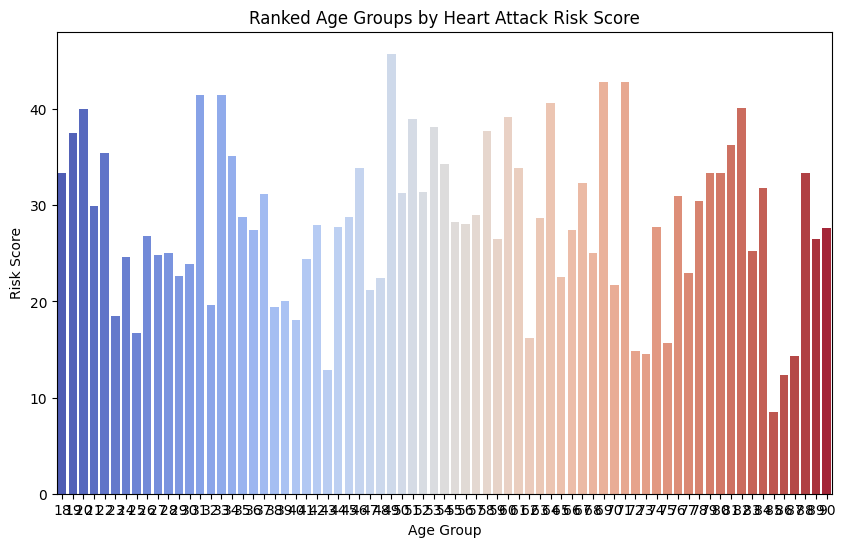

The Lowest risk score age group is : 85 with a risk score of 8.474576271186436
The Highest risk score age group is : 49 with a risk score of 45.76271186440678


In [112]:
age_risk_score = age_no_risk_percentage - age_risk_percentages['Yes']
ranked_age_risk_score = age_risk_score.sort_values(ascending=False) 
print(ranked_age_risk_score)
lowest_risk_score_age = ranked_age_risk_score.idxmin()
highest_risk_score_age = ranked_age_risk_score.idxmax()
plt.figure(figsize=(10,6)) 
sns.barplot(x=ranked_age_risk_score.index, y=ranked_age_risk_score, palette='coolwarm')
plt.title('Ranked Age Groups by Heart Attack Risk Score')
plt.xlabel('Age Group')
plt.ylabel('Risk Score')
plt.show()

print(f"The Lowest risk score age group is : {lowest_risk_score_age} with a risk score of {ranked_age_risk_score.loc[lowest_risk_score_age]}")
print(f"The Highest risk score age group is : {highest_risk_score_age} with a risk score of {ranked_age_risk_score.loc[highest_risk_score_age]}")

**Heart Attack Risk by Cholestrol**

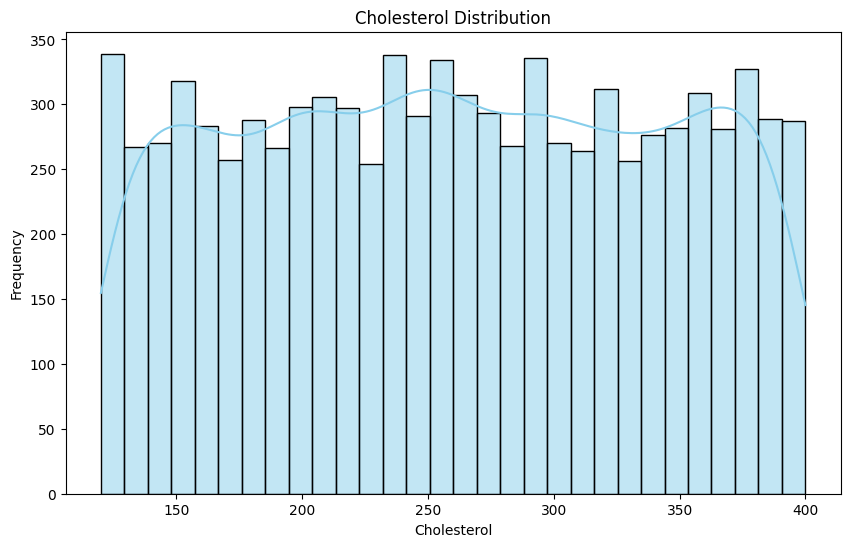

In [113]:
plt.figure(figsize=(10,6))
sns.histplot(df['Cholesterol'], kde=True, bins=30, color='Skyblue') 
plt.title('Cholesterol Distribution')
plt.xlabel('Cholesterol')
plt.ylabel('Frequency')
plt.show()

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\3594721975.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='Heart Attack Risk', y='Cholesterol', palette='coolwarm')


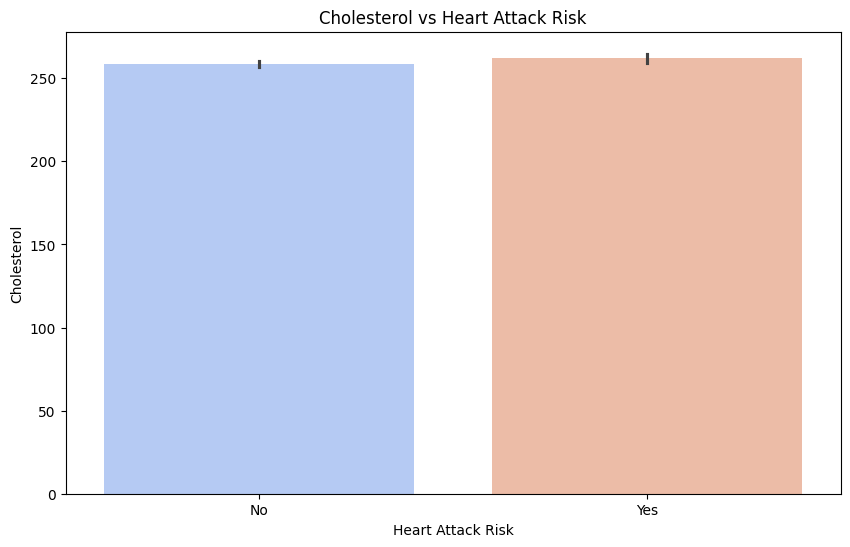

In [114]:
plt.figure(figsize=(10,6))
sns.barplot(data=df, x='Heart Attack Risk', y='Cholesterol', palette='coolwarm')
plt.title('Cholesterol vs Heart Attack Risk')
plt.xlabel('Heart Attack Risk')
plt.ylabel('Cholesterol')
plt.show()

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\863994880.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Heart Attack Risk', y='Cholesterol', palette='coolwarm')


Text(0.5, 1.0, 'Cholesterol vs Heart Attack Risk')

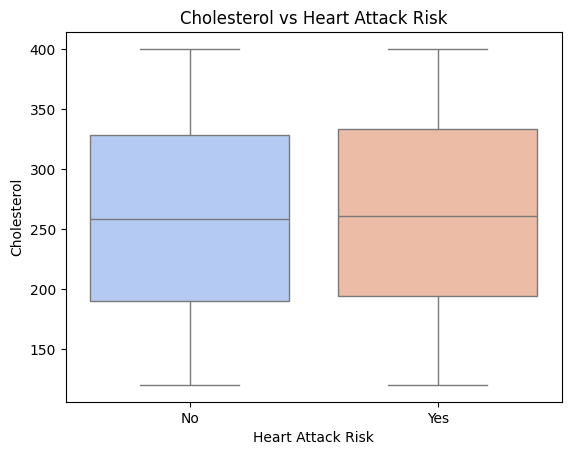

In [115]:
sns.boxplot(data=df, x='Heart Attack Risk', y='Cholesterol', palette='coolwarm')
plt.title('Cholesterol vs Heart Attack Risk')

Text(0, 0.5, 'Frequency')

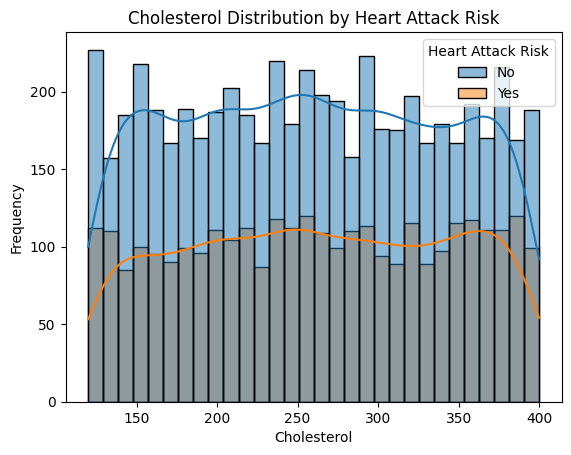

In [116]:
sns.histplot(data=df, x='Cholesterol', hue ='Heart Attack Risk', kde=True, bins=30, color='Skyblue')
plt.title('Cholesterol Distribution by Heart Attack Risk')
plt.xlabel('Cholesterol')
plt.ylabel('Frequency') 

Heart Attack Risk by Heart Rate 

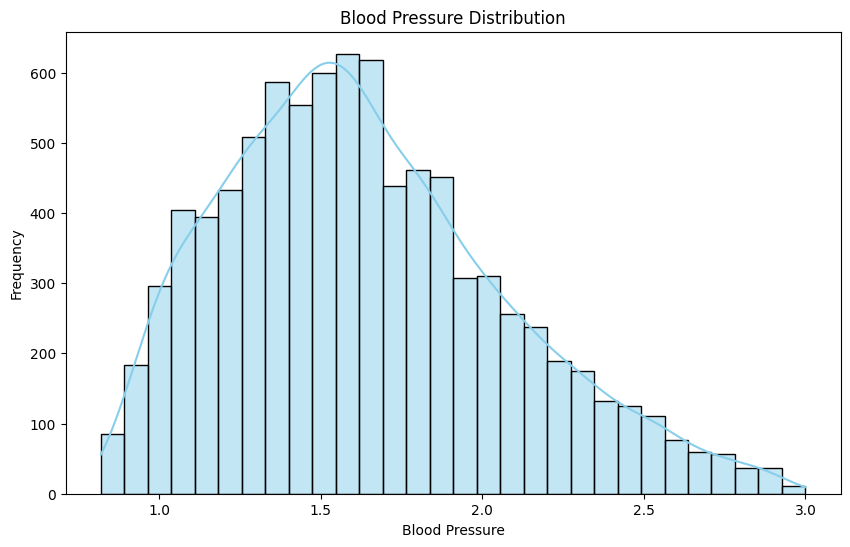

In [117]:
plt.figure(figsize=(10,6))
sns.histplot(df['BP_Ratio'], kde=True, bins=30, color='Skyblue')
plt.title('Blood Pressure Distribution')
plt.xlabel('Blood Pressure')
plt.ylabel('Frequency')
plt.show()

Systolic Distribution

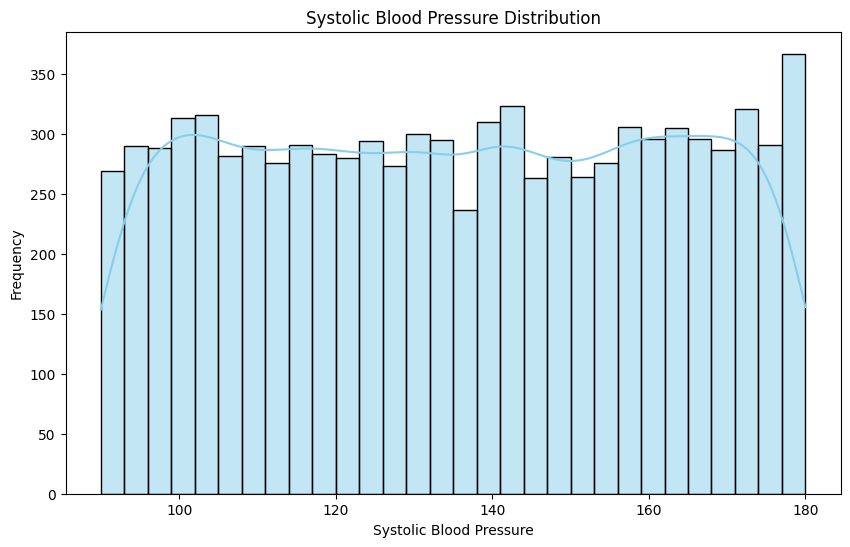

In [122]:
plt.figure(figsize=(10,6))
sns.histplot(df['Systolic'], kde=True, bins=30, color='Skyblue')
plt.title('Systolic Blood Pressure Distribution')
plt.xlabel('Systolic Blood Pressure')
plt.ylabel('Frequency')
plt.show()

Diastolic Distribution

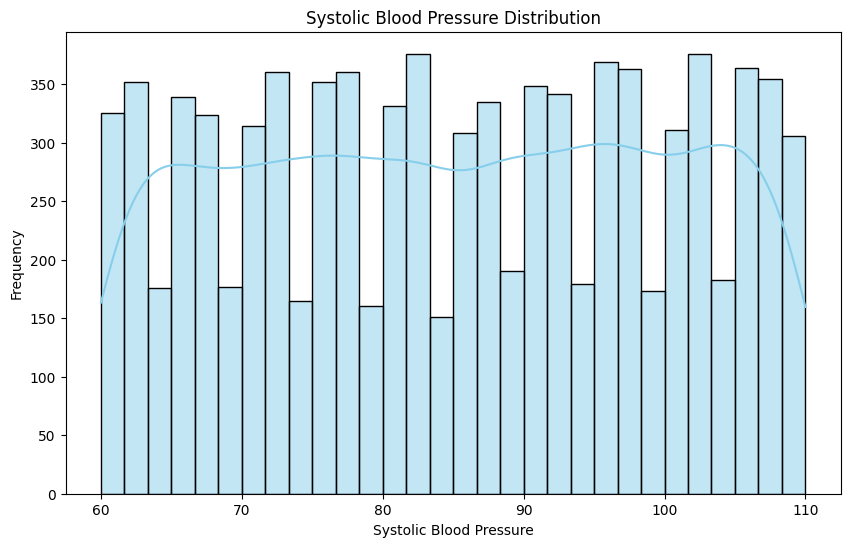

In [123]:
plt.figure(figsize=(10,6))
sns.histplot(df['Diastolic'], kde=True, bins=30, color='Skyblue')
plt.title('Systolic Blood Pressure Distribution')
plt.xlabel('Systolic Blood Pressure')
plt.ylabel('Frequency')
plt.show()

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\4221952051.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Heart Attack Risk', y='BP_Ratio', palette='coolwarm')


Text(0, 0.5, 'Blood Pressure Ratio')

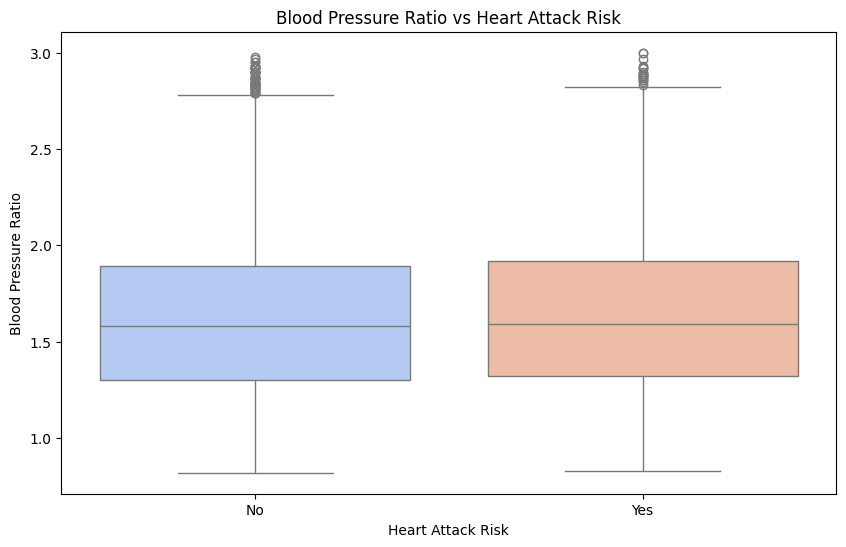

In [124]:
# Boxplot of BP_Ratio by Heart Attack Risk
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='Heart Attack Risk', y='BP_Ratio', palette='coolwarm')
plt.title('Blood Pressure Ratio vs Heart Attack Risk')
plt.xlabel('Heart Attack Risk')
plt.ylabel('Blood Pressure Ratio')

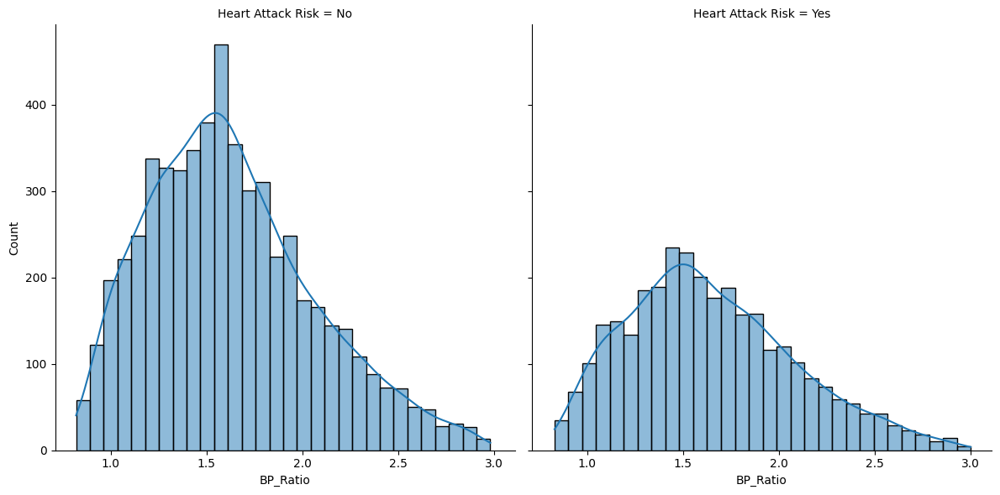

In [128]:
# FacetGrid of BP_Ratio by Heart Attack Risk
g = sns.FacetGrid(df, col='Heart Attack Risk', palette='coolwarm', height=6, aspect=1)
g.map(sns.histplot, 'BP_Ratio', kde=True, bins=30)


<Axes: xlabel='Diabetes', ylabel='Count'>

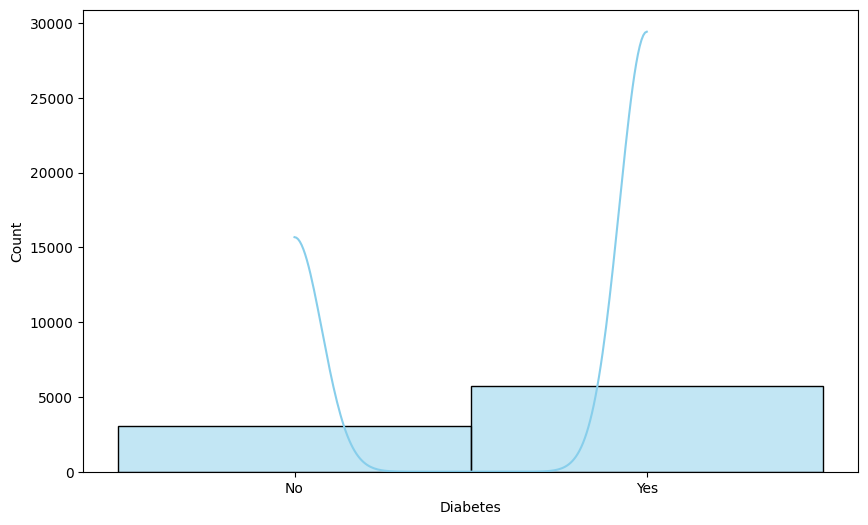

In [ ]:
# plt.figure(figsize=(10,6))
# sns.histplot(df['Diabetes'], kde=True, bins=30, color='Skyblue')

Heart Attack Risk by Diabetes

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\3231386611.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df,x='Diabetes', palette='deep')


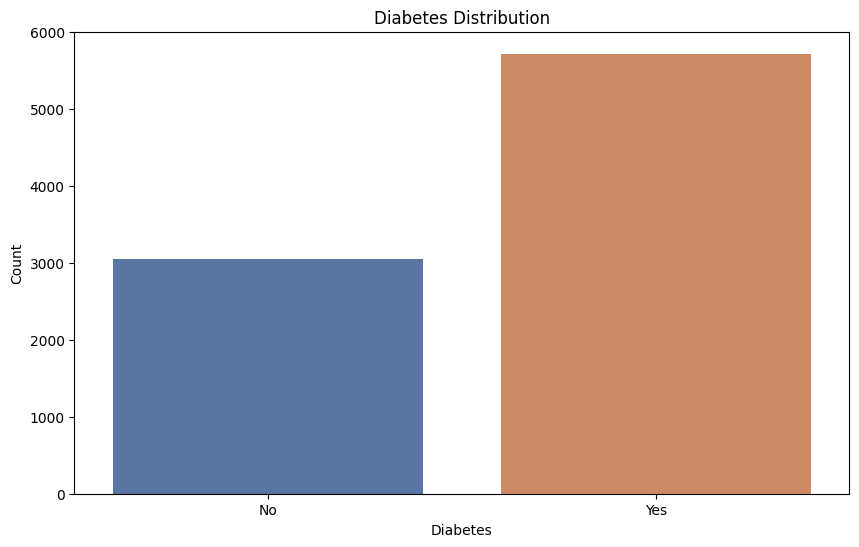

In [132]:
plt.figure(figsize=(10,6))
sns.countplot(data=df,x='Diabetes', palette='deep')

plt.title('Diabetes Distribution')
plt.xlabel('Diabetes')
plt.ylabel('Count')
# plt.xticks([0,1],['No', 'Yes'])
plt.show()


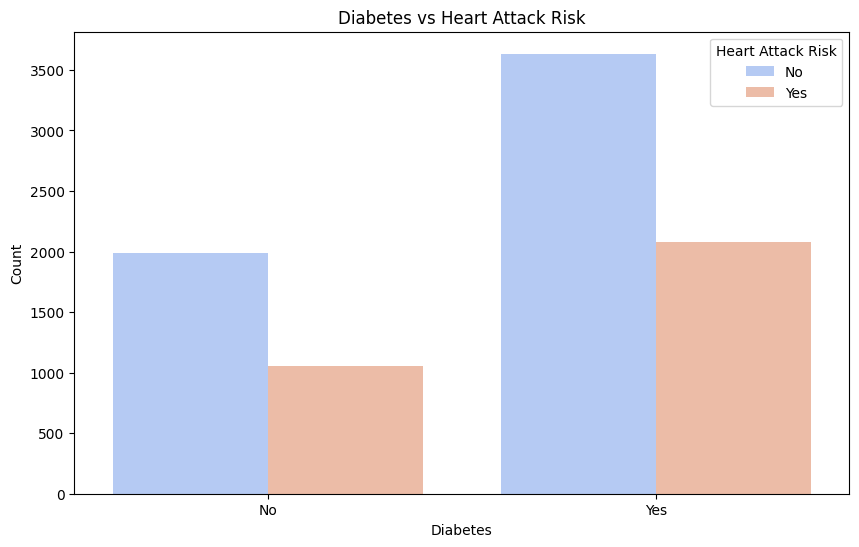

In [134]:
plt.figure(figsize=(10,6))  
sns.countplot(data=df, x='Diabetes', hue='Heart Attack Risk', palette='coolwarm')
plt.title('Diabetes vs Heart Attack Risk')
plt.xlabel('Diabetes')
plt.ylabel('Count')
plt.show()

Heart Attack Risk by Family History

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\464773755.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Family History', palette='Set2')


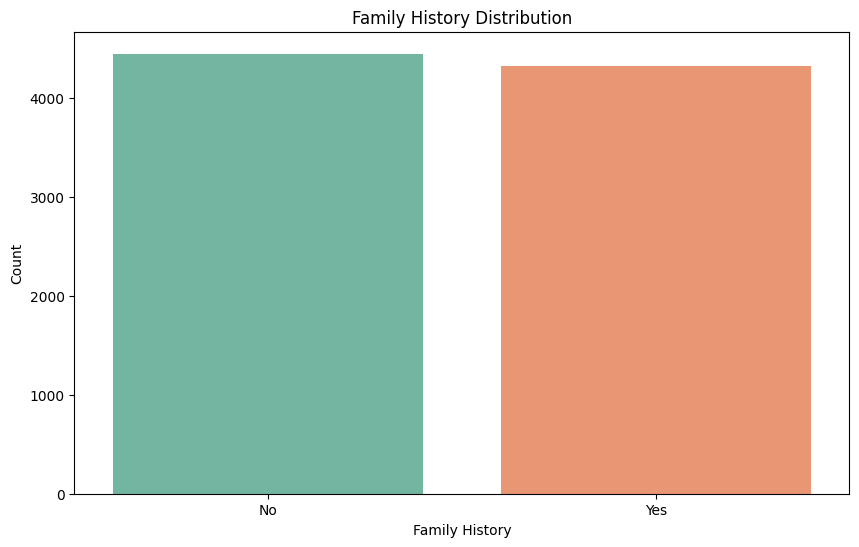

In [135]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Family History', palette='Set2')
plt.title('Family History Distribution')
plt.xlabel('Family History')
plt.ylabel('Count')
plt.show()

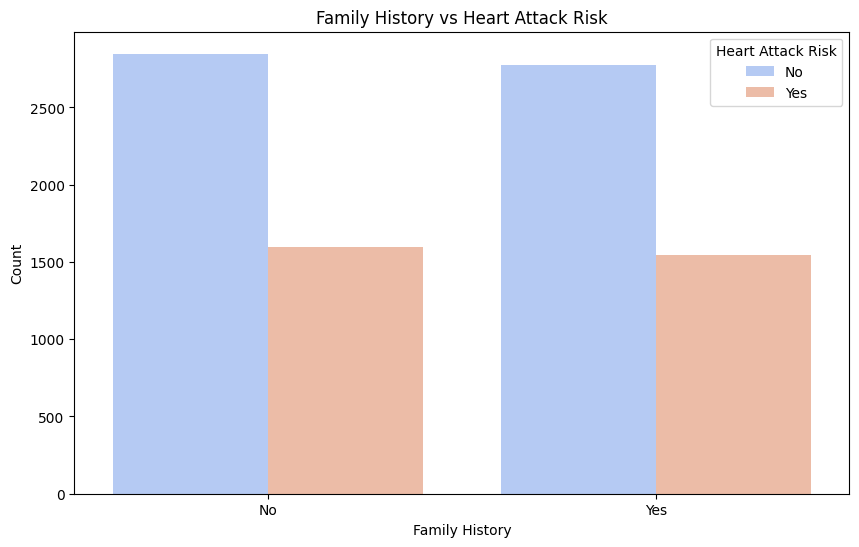

In [137]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Family History', hue='Heart Attack Risk', palette='coolwarm')
plt.title('Family History vs Heart Attack Risk')
plt.xlabel('Family History')
plt.ylabel('Count')
plt.show()

Heart Attack Risk by Smoking

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\3656893280.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Smoking', palette='Set2')


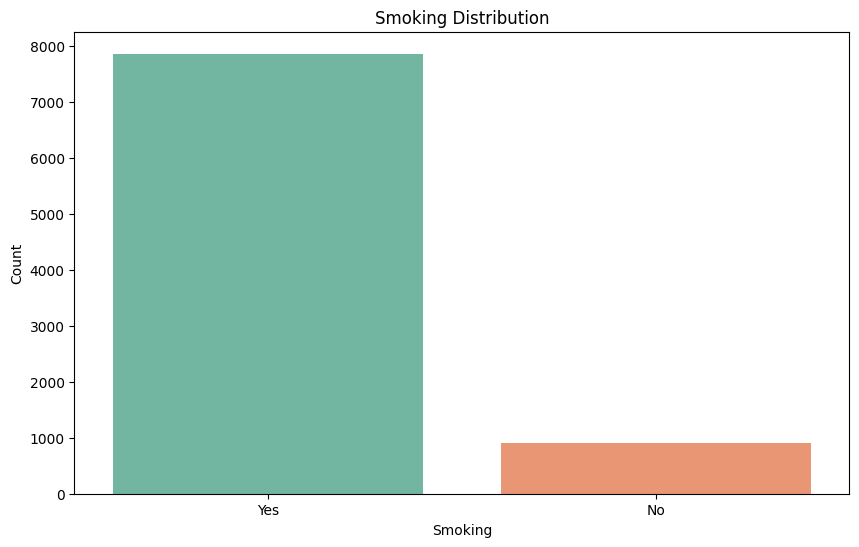

In [138]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Smoking', palette='Set2')
plt.title('Smoking Distribution')
plt.xlabel('Smoking')
plt.ylabel('Count')
plt.show()

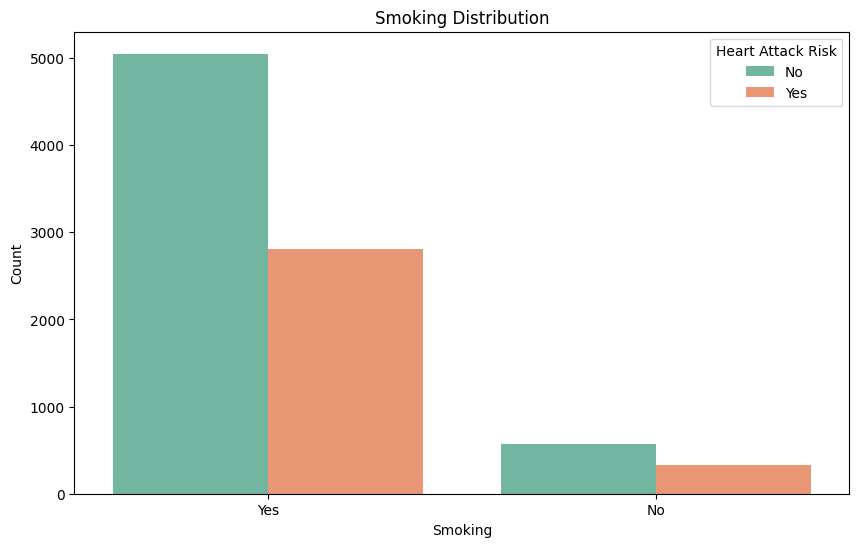

In [141]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Smoking', hue='Heart Attack Risk' ,palette='Set2')
plt.title('Smoking Distribution')
plt.xlabel('Smoking')
plt.ylabel('Count')
plt.show()

In [147]:
df

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,67,Male,208,158,88,1.80,72,No,No,Yes,No,No,4.168189,Average,No,No,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,No
1,21,Male,389,165,93,1.77,98,Yes,Yes,Yes,Yes,Yes,1.813242,Unhealthy,Yes,No,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,No
2,21,Female,324,174,99,1.76,72,Yes,No,No,No,No,2.078353,Healthy,Yes,Yes,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,No
3,84,Male,383,163,100,1.63,73,Yes,Yes,Yes,No,Yes,9.828130,Average,Yes,No,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,No
4,66,Male,318,91,88,1.03,93,Yes,Yes,Yes,Yes,No,5.804299,Unhealthy,Yes,No,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8758,60,Male,121,94,76,1.24,61,Yes,Yes,Yes,No,Yes,7.917342,Healthy,Yes,Yes,8,10.806373,235420,19.655895,67,7,7,Thailand,Asia,Northern Hemisphere,No
8759,28,Female,120,157,102,1.54,73,Yes,No,No,Yes,No,16.558426,Healthy,No,No,8,3.833038,217881,23.993866,617,4,9,Canada,North America,Northern Hemisphere,No
8760,47,Male,250,161,75,2.15,105,No,Yes,Yes,Yes,Yes,3.148438,Average,Yes,No,5,2.375214,36998,35.406146,527,4,4,Brazil,South America,Southern Hemisphere,Yes
8761,36,Male,178,119,67,1.78,60,Yes,No,Yes,No,No,3.789950,Unhealthy,Yes,Yes,5,0.029104,209943,27.294020,114,2,8,Brazil,South America,Southern Hemisphere,No


Total smokers with heart risk: 7859
Heart Attack Risk
No     64.244815
Yes    35.755185
Name: Yes, dtype: float64


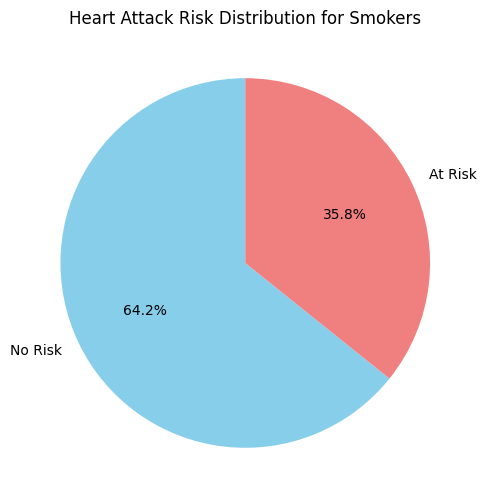

In [151]:
total_smokers_with_Heart_risk = df['Smoking'].value_counts().get('Yes', 0)  # Ensures it doesn't error if 'Yes' is missing
print(f"Total smokers with heart risk: {total_smokers_with_Heart_risk}")
risk_by_smoking = df.groupby(['Smoking', 'Heart Attack Risk']).size().unstack(fill_value=0)
# print(risk_by_smoking)
smoking_percentage = risk_by_smoking.loc['Yes']/total_smokers_with_Heart_risk * 100
print(smoking_percentage)
plt.figure(figsize=(10,6))
plt.pie(smoking_percentage, labels=['No Risk', 'At Risk'], autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
plt.title('Heart Attack Risk Distribution for Smokers')
plt.show()

Heart Attack Risk by Alcohol Consumption

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\1449025098.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Alcohol Consumption', palette='Set2')


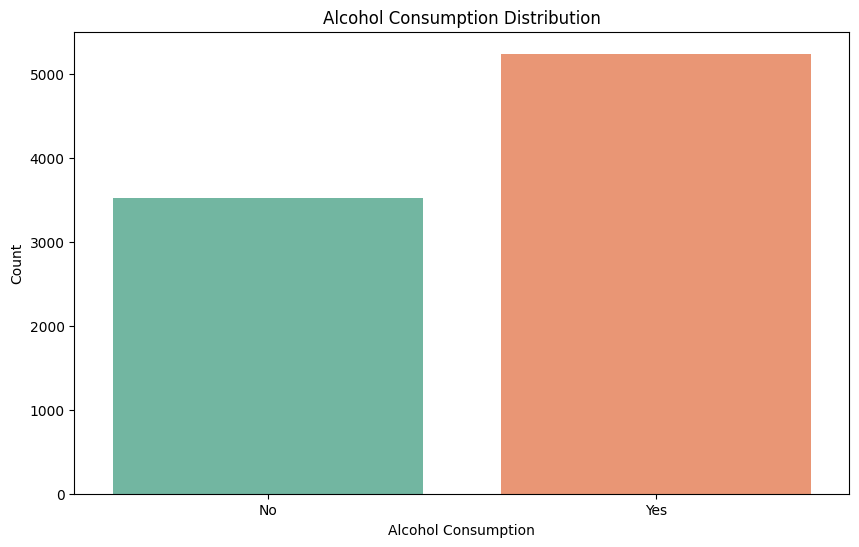

In [152]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Alcohol Consumption', palette='Set2')
plt.title('Alcohol Consumption Distribution')
plt.xlabel('Alcohol Consumption')
plt.ylabel('Count')
plt.show()

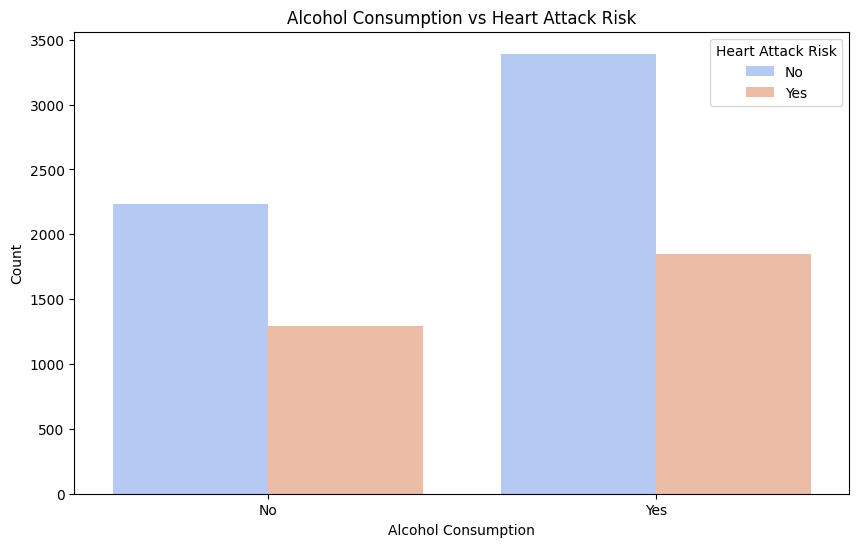

In [153]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, x='Alcohol Consumption', hue='Heart Attack Risk', palette='coolwarm')
plt.title('Alcohol Consumption vs Heart Attack Risk')
plt.xlabel('Alcohol Consumption')
plt.ylabel('Count')
plt.show()


Total drinkers with heart risk: 5241
Heart Attack Risk
No     64.720473
Yes    35.279527
Name: Yes, dtype: float64


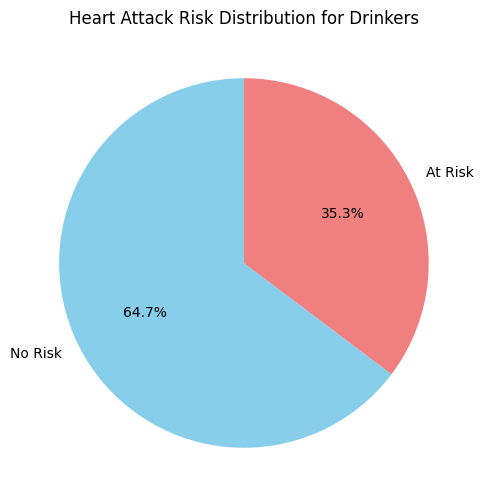

In [154]:
total_drinker_with_Heart_risk = df['Alcohol Consumption'].value_counts().get('Yes', 0) 
print(f"Total drinkers with heart risk: {total_drinker_with_Heart_risk}")
risk_by_drinking = df.groupby(['Alcohol Consumption', 'Heart Attack Risk']).size().unstack(fill_value=0)
drinking_percentage = risk_by_drinking.loc['Yes']/total_drinker_with_Heart_risk * 100
print(drinking_percentage)
plt.figure(figsize=(10,6))
plt.pie(drinking_percentage, labels=['No Risk', 'At Risk'], autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
plt.title('Heart Attack Risk Distribution for Drinkers')
plt.show()

Heart Attack Risk by Diet

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\1851353289.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Diet', palette='Set2')


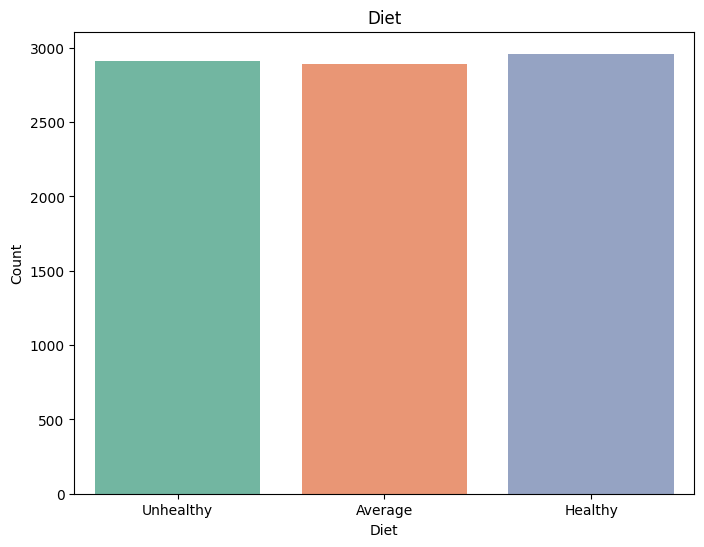

In [155]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Diet', palette='Set2')


plt.title('Diet')
plt.xlabel('Diet')
plt.ylabel('Count')
plt.xticks([0, 1, 2], ['Unhealthy', 'Average', 'Healthy' ])  
plt.show()

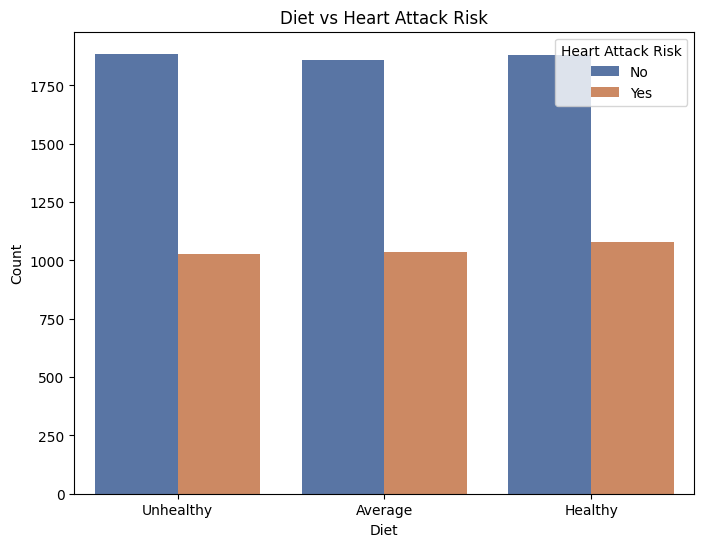

In [156]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Diet', hue='Heart Attack Risk', palette='deep')


plt.title('Diet vs Heart Attack Risk')
plt.xlabel('Diet')
plt.ylabel('Count')
plt.xticks([0, 1, 2], ['Unhealthy', 'Average', 'Healthy' ])  
plt.legend(title='Heart Attack Risk', labels=['No', 'Yes'])
plt.show()

Heart Attack Risk by Previous Heart Problems

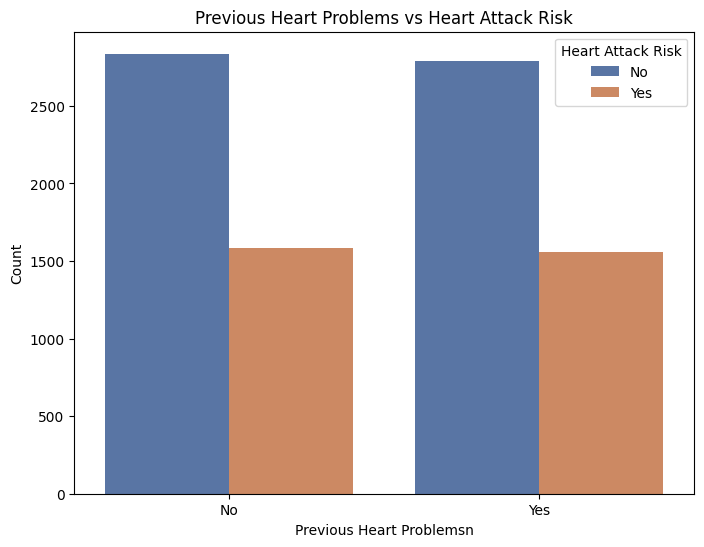

In [157]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Previous Heart Problems', hue='Heart Attack Risk', palette='deep')


plt.title('Previous Heart Problems vs Heart Attack Risk')
plt.xlabel('Previous Heart Problemsn')
plt.ylabel('Count')
plt.xticks([0, 1], ['No', 'Yes'])  
plt.legend(title='Heart Attack Risk', labels=['No', 'Yes'])
plt.show()

Heart Attack Risk by Medication Use

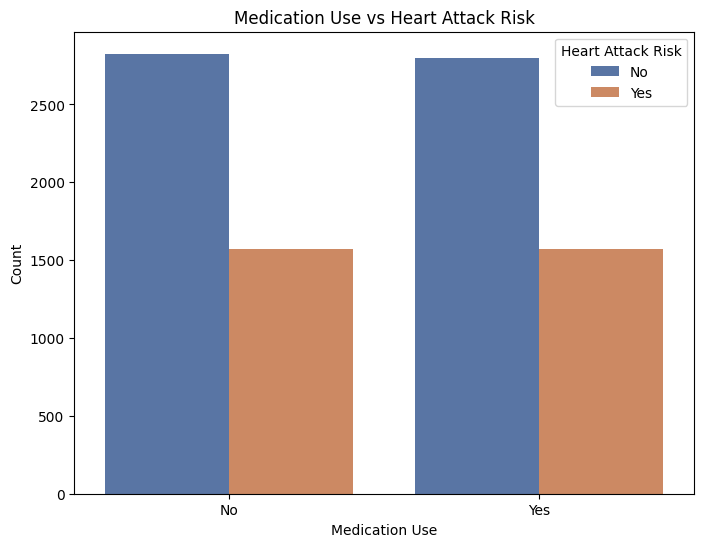

In [159]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Medication Use', hue='Heart Attack Risk', palette='deep')

plt.title('Medication Use vs Heart Attack Risk')
plt.xlabel('Medication Use')
plt.ylabel('Count')
plt.xticks([0, 1], ['No', 'Yes'])  
plt.legend(title='Heart Attack Risk', labels=['No', 'Yes'])
plt.show()

Heart Risk Attack by Stress Level

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\514047997.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Stress Level', palette='Set2')


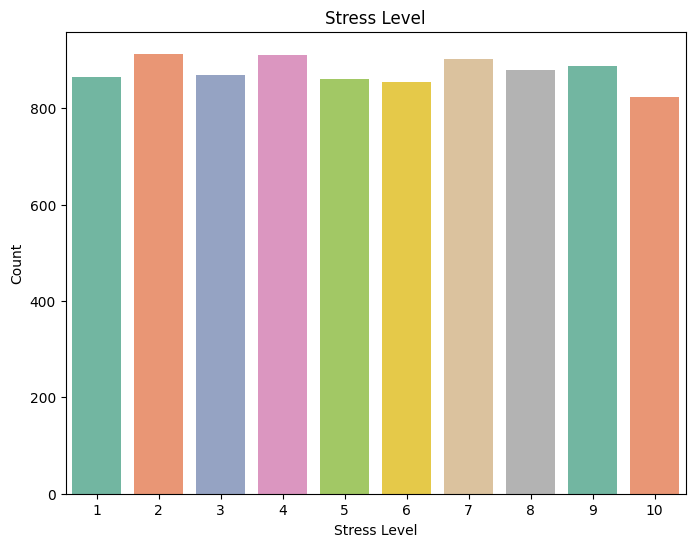

In [160]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Stress Level', palette='Set2')

# Labels and title
plt.title('Stress Level')
plt.xlabel('Stress Level')
plt.ylabel('Count')
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9 ], ['1','2','3','4','5','6','7','8','9','10'])  
plt.show()


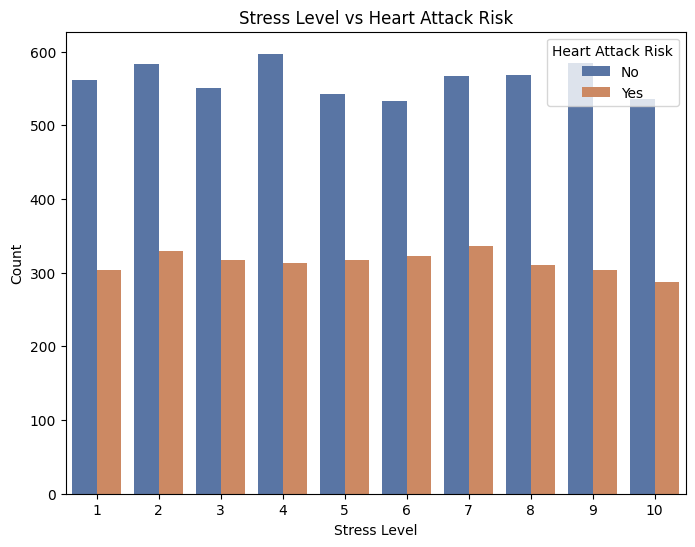

In [161]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Stress Level', hue='Heart Attack Risk', palette='deep')

# Labels and title
plt.title('Stress Level vs Heart Attack Risk')
plt.xlabel('Stress Level')
plt.ylabel('Count')
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9 ], ['1','2','3','4','5','6','7','8','9','10'])  
plt.legend(title='Heart Attack Risk', labels=['No', 'Yes'])
plt.show()

BMI Distribution

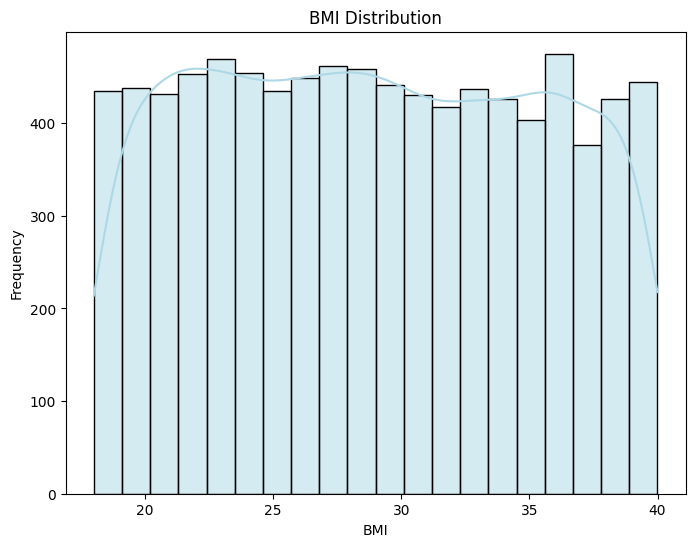

In [163]:
plt.figure(figsize=(8, 6))
sns.histplot(df['BMI'], kde=True, bins=20, color='lightblue')
plt.title('BMI Distribution')
plt.xlabel('BMI')
plt.ylabel('Frequency')
plt.show()

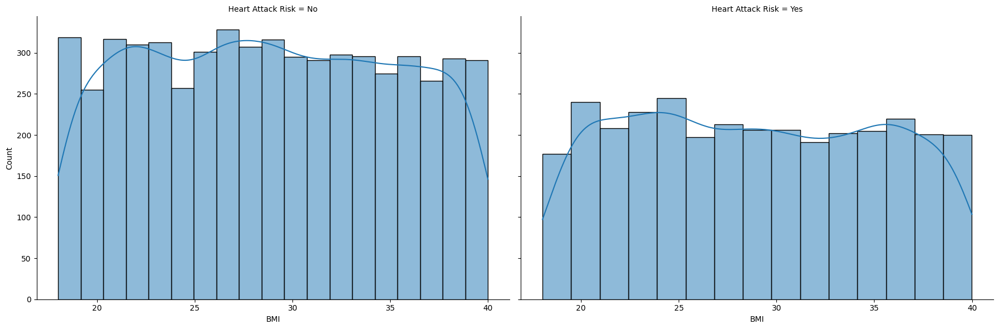

In [ ]:

g = sns.FacetGrid(df, col='Heart Attack Risk', palette='coolwarm', height=6, aspect=1.5)
g.map(sns.histplot, 'BMI', kde=True)


plt.show()

Heart Attack Risk Case by Country

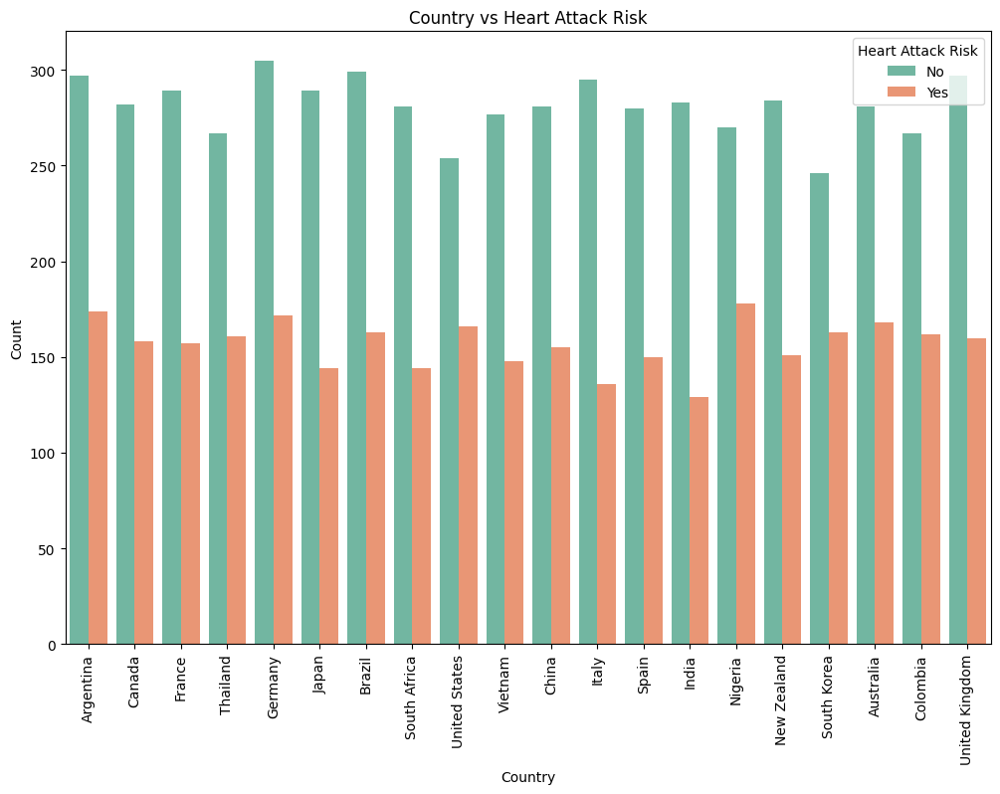

In [165]:
plt.figure(figsize=(12, 8))
sns.countplot(data=df, x='Country', hue='Heart Attack Risk', palette='Set2')

plt.title('Country vs Heart Attack Risk')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotate country labels to fit them
plt.legend(title='Heart Attack Risk', labels=['No', 'Yes'])
plt.show()

Heart Attack Risk         No        Yes
Country                                
Argentina          63.057325  36.942675
Australia          62.583519  37.416481
Brazil             64.718615  35.281385
Canada             64.090909  35.909091
China              64.449541  35.550459
Colombia           62.237762  37.762238
France             64.798206  35.201794
Germany            63.941300  36.058700
India              68.689320  31.310680
Italy              68.445476  31.554524
Japan              66.743649  33.256351
New Zealand        65.287356  34.712644
Nigeria            60.267857  39.732143
South Africa       66.117647  33.882353
South Korea        60.146699  39.853301
Spain              65.116279  34.883721
Thailand           62.383178  37.616822
United Kingdom     64.989059  35.010941
United States      60.476190  39.523810
Vietnam            65.176471  34.823529


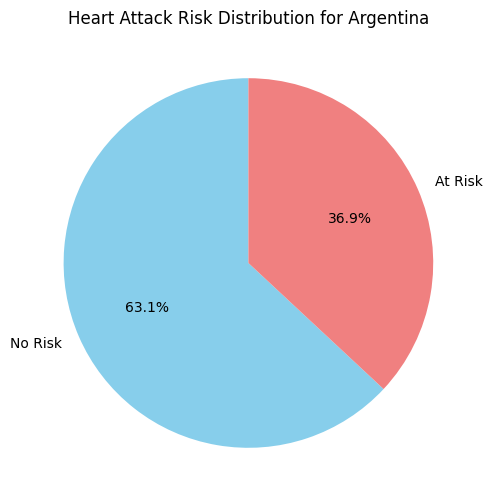

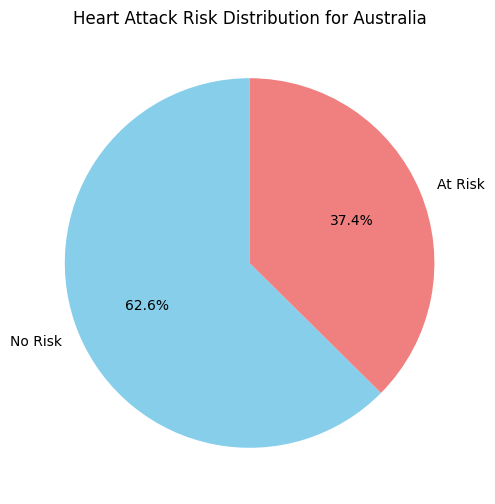

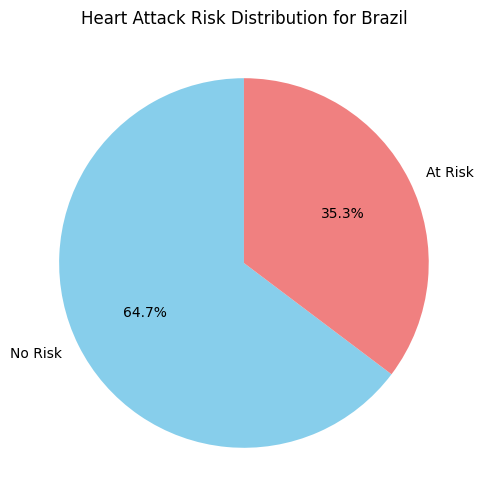

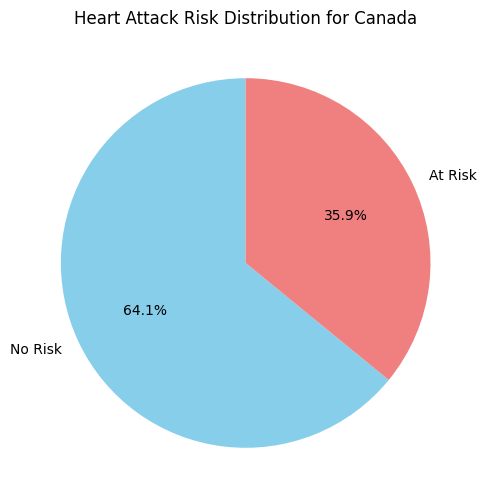

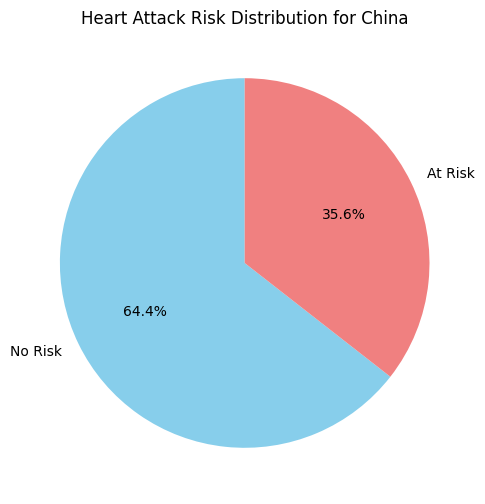

...

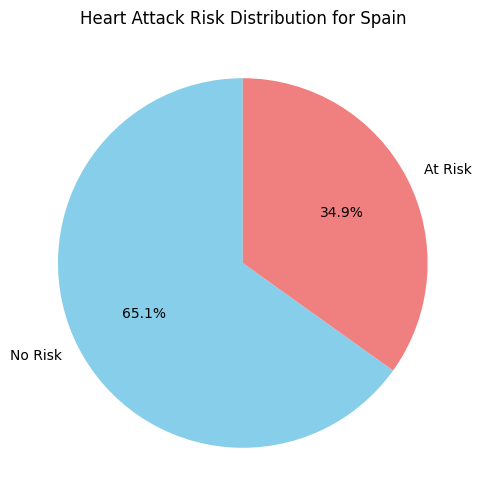

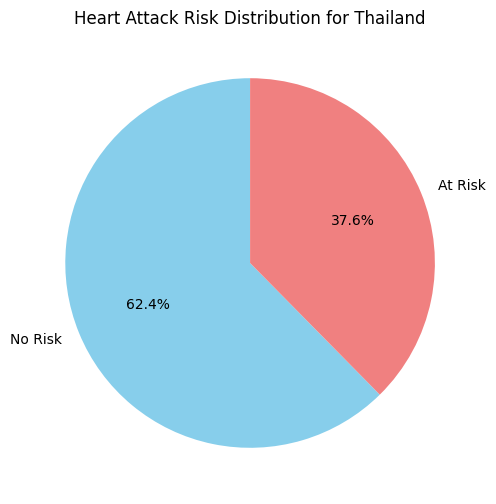

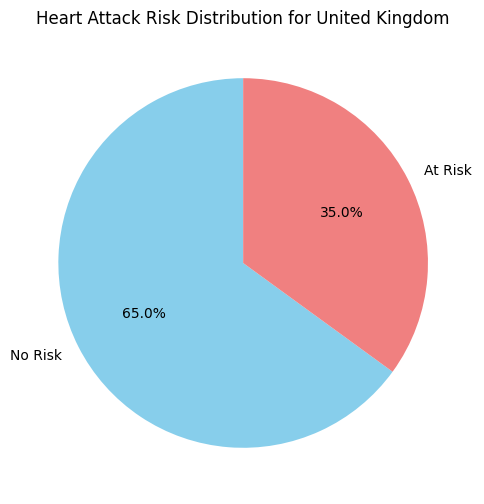

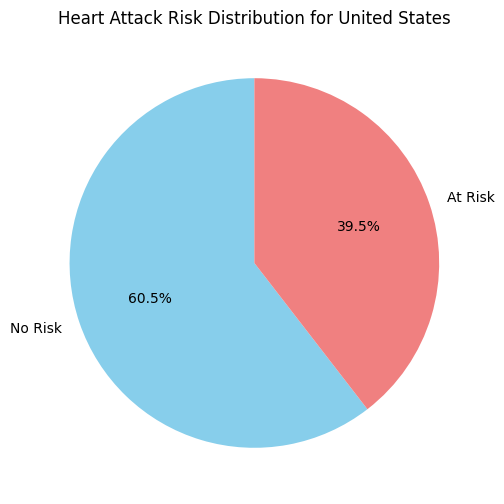

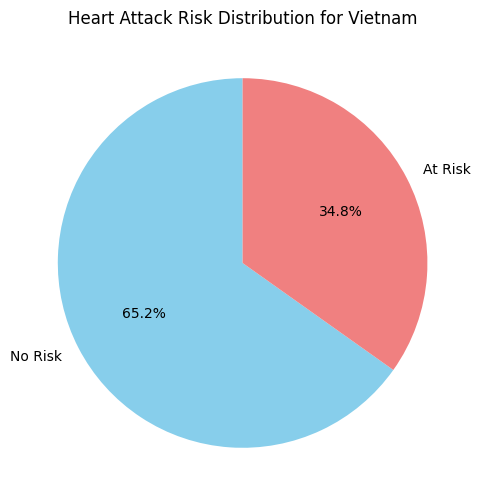

In [166]:
risk_by_country = df.groupby(['Country', 'Heart Attack Risk']).size().unstack(fill_value=0)
percentage_by_country = risk_by_country.div(risk_by_country.sum(axis=1), axis=0) * 100
print(percentage_by_country)
for country in percentage_by_country.index:
    plt.figure(figsize=(10, 6))
    plt.pie(percentage_by_country.loc[country], labels=['No Risk','At Risk'], autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
    plt.title(f'Heart Attack Risk Distribution for {country}')
    plt.show()


**Data Preprocessing**

Encode Catagorical Data

In [167]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              8763 non-null   int64  
 1   Sex                              8763 non-null   object 
 2   Cholesterol                      8763 non-null   int64  
 3   Systolic                         8763 non-null   int64  
 4   Diastolic                        8763 non-null   int64  
 5   BP_Ratio                         8763 non-null   float64
 6   Heart Rate                       8763 non-null   int64  
 7   Diabetes                         8763 non-null   object 
 8   Family History                   8763 non-null   object 
 9   Smoking                          8763 non-null   object 
 10  Obesity                          8763 non-null   object 
 11  Alcohol Consumption              8763 non-null   object 
 12  Exercise Hours Per W

In [170]:
# Converting the Yes/no value in the column to 1/0
for column in df.columns:
    if df[column].dtype == 'object' and df[column].isin(['Yes','No']).all():
        df[column] = df[column].map({'No':0, 'Yes':1})
df.head()

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,67,Male,208,158,88,1.80,72,0,0,1,0,0,4.168189,Average,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,21,Male,389,165,93,1.77,98,1,1,1,1,1,1.813242,Unhealthy,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,21,Female,324,174,99,1.76,72,1,0,0,0,0,2.078353,Healthy,1,1,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,84,Male,383,163,100,1.63,73,1,1,1,0,1,9.828130,Average,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,66,Male,318,91,88,1.03,93,1,1,1,1,0,5.804299,Unhealthy,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [171]:
df['Sex'] = df['Sex'].map({'Female':0, 'Male':1})
df['Diet'] = df['Diet'].map({'Unhealthy':0, 'Average':1,'Healthy':2})   
df.head()

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,67,1,208,158,88,1.80,72,0,0,1,0,0,4.168189,1,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,21,1,389,165,93,1.77,98,1,1,1,1,1,1.813242,0,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,21,0,324,174,99,1.76,72,1,0,0,0,0,2.078353,2,1,1,9,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,84,1,383,163,100,1.63,73,1,1,1,0,1,9.828130,1,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,66,1,318,91,88,1.03,93,1,1,1,1,0,5.804299,0,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [172]:
# One Hot Encodingo 'Continent' and 'Hemisphere' columns
df = pd.get_dummies(df, columns=['Continent', 'Hemisphere'], drop_first=True)
df.head()

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Heart Attack Risk,Continent_Asia,Continent_Australia,Continent_Europe,Continent_North America,Continent_South America,Hemisphere_Southern Hemisphere
0,67,1,208,158,88,1.80,72,0,0,1,0,0,4.168189,1,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,0,False,False,False,False,True,True
1,21,1,389,165,93,1.77,98,1,1,1,1,1,1.813242,0,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,0,False,False,False,True,False,False
2,21,0,324,174,99,1.76,72,1,0,0,0,0,2.078353,2,1,1,9,9.463426,235282,28.176571,587,4,4,France,0,False,False,True,False,False,False
3,84,1,383,163,100,1.63,73,1,1,1,0,1,9.828130,1,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,0,False,False,False,True,False,False
4,66,1,318,91,88,1.03,93,1,1,1,1,0,5.804299,0,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,0,True,False,False,False,False,False


In [177]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              8763 non-null   int64  
 1   Sex                              8763 non-null   int64  
 2   Cholesterol                      8763 non-null   int64  
 3   Systolic                         8763 non-null   int64  
 4   Diastolic                        8763 non-null   int64  
 5   BP_Ratio                         8763 non-null   float64
 6   Heart Rate                       8763 non-null   int64  
 7   Diabetes                         8763 non-null   int64  
 8   Family History                   8763 non-null   int64  
 9   Smoking                          8763 non-null   int64  
 10  Obesity                          8763 non-null   int64  
 11  Alcohol Consumption              8763 non-null   int64  
 12  Exercise Hours Per W

In [183]:

for column in df.columns:
    if df[column].dtype == 'bool' and df[column].isin([True,False]).all():
        df[column] = df[column].map({False:0, True:1})
df.head()  
 

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Heart Attack Risk,Continent_Asia,Continent_Australia,Continent_Europe,Continent_North America,Continent_South America,Hemisphere_Southern Hemisphere
0,67,1,208,158,88,1.80,72,0,0,1,0,0,4.168189,1,0,0,9,6.615001,261404,31.251233,286,0,6,Argentina,0,0,0,0,0,1,1
1,21,1,389,165,93,1.77,98,1,1,1,1,1,1.813242,0,1,0,1,4.963459,285768,27.194973,235,1,7,Canada,0,0,0,0,1,0,0
2,21,0,324,174,99,1.76,72,1,0,0,0,0,2.078353,2,1,1,9,9.463426,235282,28.176571,587,4,4,France,0,0,0,1,0,0,0
3,84,1,383,163,100,1.63,73,1,1,1,0,1,9.828130,1,1,0,9,7.648981,125640,36.464704,378,3,4,Canada,0,0,0,0,1,0,0
4,66,1,318,91,88,1.03,93,1,1,1,1,0,5.804299,0,1,0,6,1.514821,160555,21.809144,231,1,5,Thailand,0,1,0,0,0,0,0


Country is not very importent column so dropping the 'Country'

In [184]:
df = df.drop(columns='Country')
df.head()

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Heart Attack Risk,Continent_Asia,Continent_Australia,Continent_Europe,Continent_North America,Continent_South America,Hemisphere_Southern Hemisphere
0,67,1,208,158,88,1.80,72,0,0,1,0,0,4.168189,1,0,0,9,6.615001,261404,31.251233,286,0,6,0,0,0,0,0,1,1
1,21,1,389,165,93,1.77,98,1,1,1,1,1,1.813242,0,1,0,1,4.963459,285768,27.194973,235,1,7,0,0,0,0,1,0,0
2,21,0,324,174,99,1.76,72,1,0,0,0,0,2.078353,2,1,1,9,9.463426,235282,28.176571,587,4,4,0,0,0,1,0,0,0
3,84,1,383,163,100,1.63,73,1,1,1,0,1,9.828130,1,1,0,9,7.648981,125640,36.464704,378,3,4,0,0,0,0,1,0,0
4,66,1,318,91,88,1.03,93,1,1,1,1,0,5.804299,0,1,0,6,1.514821,160555,21.809144,231,1,5,0,1,0,0,0,0,0


In [185]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 30 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              8763 non-null   int64  
 1   Sex                              8763 non-null   int64  
 2   Cholesterol                      8763 non-null   int64  
 3   Systolic                         8763 non-null   int64  
 4   Diastolic                        8763 non-null   int64  
 5   BP_Ratio                         8763 non-null   float64
 6   Heart Rate                       8763 non-null   int64  
 7   Diabetes                         8763 non-null   int64  
 8   Family History                   8763 non-null   int64  
 9   Smoking                          8763 non-null   int64  
 10  Obesity                          8763 non-null   int64  
 11  Alcohol Consumption              8763 non-null   int64  
 12  Exercise Hours Per W

In [ ]:
# Taking the 'Heart Attack Risk' column to the last index
cols = [col for col in df.columns if col != 'Heart Attack Risk']  
df = df[cols + ['Heart Attack Risk']]  
#Final Data
df.head()


,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Continent_Asia,Continent_Australia,Continent_Europe,Continent_North America,Continent_South America,Hemisphere_Southern Hemisphere,Heart Attack Risk
0,67,1,208,158,88,1.80,72,0,0,1,0,0,4.168189,1,0,0,9,6.615001,261404,31.251233,286,0,6,0,0,0,0,1,1,0
1,21,1,389,165,93,1.77,98,1,1,1,1,1,1.813242,0,1,0,1,4.963459,285768,27.194973,235,1,7,0,0,0,1,0,0,0
2,21,0,324,174,99,1.76,72,1,0,0,0,0,2.078353,2,1,1,9,9.463426,235282,28.176571,587,4,4,0,0,1,0,0,0,0
3,84,1,383,163,100,1.63,73,1,1,1,0,1,9.828130,1,1,0,9,7.648981,125640,36.464704,378,3,4,0,0,0,1,0,0,0
4,66,1,318,91,88,1.03,93,1,1,1,1,0,5.804299,0,1,0,6,1.514821,160555,21.809144,231,1,5,1,0,0,0,0,0,0


**Feature Selection**

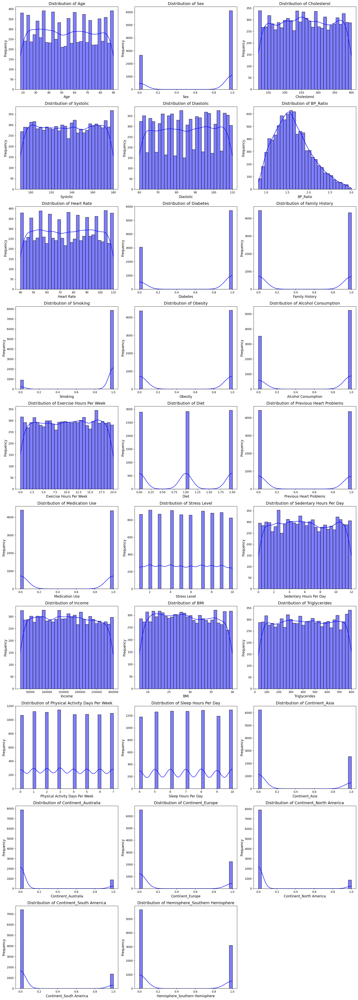

In [ ]:
df_features = df.iloc[:,:-1]

def plot_distributions(df, cols_per_row=3):
    num_cols = len(df.columns)
    num_rows = (num_cols // cols_per_row) + int(num_cols % cols_per_row > 0)

    plt.figure(figsize=(cols_per_row * 6, num_rows * 5))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(num_rows, cols_per_row, i)
        sns.histplot(df[column], kde=True, bins=30, color='blue', edgecolor='black')
        plt.title(f"Distribution of {column}", fontsize=14)  
        plt.xlabel(column, fontsize=12)  
        plt.ylabel("Frequency", fontsize=12)  
        plt.tight_layout()
    plt.show()

# Call the function to plot distributions
plot_distributions(df_features, cols_per_row=3)



**Descriptive Statistical Analysis**

In [190]:
df.describe()

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Continent_Asia,Continent_Australia,Continent_Europe,Continent_North America,Continent_South America,Hemisphere_Southern Hemisphere,Heart Attack Risk
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,53.707977,0.697364,259.877211,135.075659,85.156111,1.635335,75.021682,0.652288,0.492982,0.896839,0.501426,0.598083,10.014284,1.007874,0.495835,0.498345,5.469702,5.993690,158263.181901,28.891446,417.677051,3.489672,7.023508,0.290197,0.100879,0.255734,0.098140,0.155426,0.354102,0.358211
std,21.249509,0.459425,80.863276,26.349976,14.676565,0.434957,20.550948,0.476271,0.499979,0.304186,0.500026,0.490313,5.783745,0.817134,0.500011,0.500026,2.859622,3.466359,80575.190806,6.319181,223.748137,2.282687,1.988473,0.453879,0.301185,0.436298,0.297521,0.362331,0.478268,0.479502
min,18.000000,0.000000,120.000000,90.000000,60.000000,0.820000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002442,0.000000,0.000000,0.000000,1.000000,0.001263,20062.000000,18.002337,30.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35.000000,0.000000,192.000000,112.000000,72.000000,1.310000,57.000000,0.000000,0.000000,1.000000,0.000000,0.000000,4.981579,0.000000,0.000000,0.000000,3.000000,2.998794,88310.000000,23.422985,225.500000,2.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,54.000000,1.000000,259.000000,135.000000,85.000000,1.580000,75.000000,1.000000,0.000000,1.000000,1.000000,1.000000,10.069559,1.000000,0.000000,0.000000,5.000000,5.933622,157866.000000,28.768999,417.000000,3.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,72.000000,1.000000,330.000000,158.000000,98.000000,1.900000,93.000000,1.000000,1.000000,1.000000,1.000000,1.000000,15.050018,2.000000,1.000000,1.000000,8.000000,9.019124,227749.000000,34.324594,612.000000,5.000000,9.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,90.000000,1.000000,400.000000,180.000000,110.000000,3.000000,110.000000,1.000000,1.000000,1.000000,1.000000,1.000000,19.998709,2.000000,1.000000,1.000000,10.000000,11.999313,299954.000000,39.997211,800.000000,7.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [192]:
df.shape

(8763, 30)

Measuring Central Tendency

In [193]:
columns_to_analyze = df.columns[0:29]

mean_values = df[columns_to_analyze].mean()
median_values = df[columns_to_analyze].median()
mode_values = df[columns_to_analyze].mode().iloc[0]

print("Mean values for features:")
print(mean_values)
print("\nMedian values for features:")
print(median_values)
print("\nMode values for features:")
print(mode_values)

Mean values for features:
Age                                    53.707977
Sex                                     0.697364
Cholesterol                           259.877211
Systolic                              135.075659
Diastolic                              85.156111
BP_Ratio                                1.635335
Heart Rate                             75.021682
Diabetes                                0.652288
Family History                          0.492982
Smoking                                 0.896839
Obesity                                 0.501426
Alcohol Consumption                     0.598083
Exercise Hours Per Week                10.014284
Diet                                    1.007874
Previous Heart Problems                 0.495835
Medication Use                          0.498345
Stress Level                            5.469702
Sedentary Hours Per Day                 5.993690
Income                             158263.181901
BMI                                    28.8

Measures of Variability

In [194]:
columns_to_analyze = df.columns[0:29]

std_values = df[columns_to_analyze].std()
variance_values = df[columns_to_analyze].var()
range_values = df[columns_to_analyze].max() - df[columns_to_analyze].min()


print("Standard Deviation values for numerical features:")
print(std_values)
print("\nVariance values for numerical features:")
print(variance_values)
print("\nRange values for numerical features:")
print(range_values)

Standard Deviation values for numerical features:
Age                                   21.249509
Sex                                    0.459425
Cholesterol                           80.863276
Systolic                              26.349976
Diastolic                             14.676565
BP_Ratio                               0.434957
Heart Rate                            20.550948
Diabetes                               0.476271
Family History                         0.499979
Smoking                                0.304186
Obesity                                0.500026
Alcohol Consumption                    0.490313
Exercise Hours Per Week                5.783745
Diet                                   0.817134
Previous Heart Problems                0.500011
Medication Use                         0.500026
Stress Level                           2.859622
Sedentary Hours Per Day                3.466359
Income                             80575.190806
BMI                                   

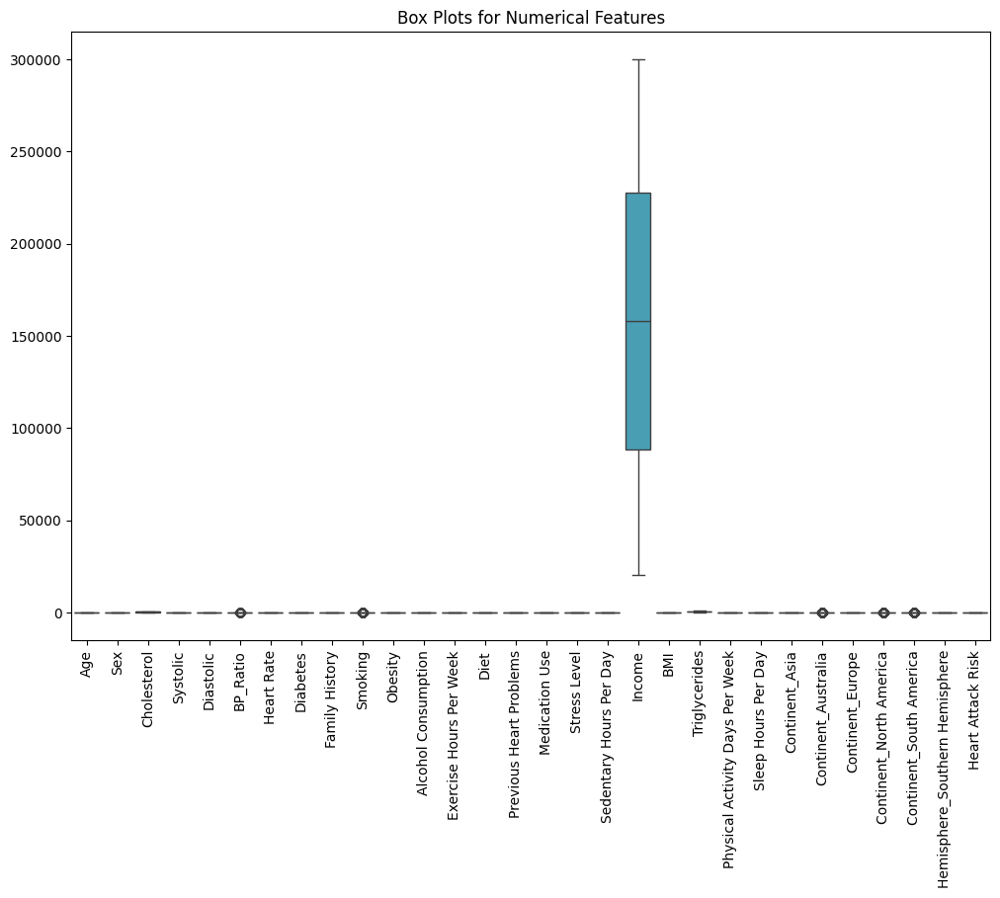

In [195]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title('Box Plots for Numerical Features')
plt.show()

Verify Outliers Using IQR

In [196]:
for  column in df.columns:
    if column != 'diagnosis':
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1

            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5* IQR

            outliers = df[(df[column]<lower_bound)|(df[column]>upper_bound)]
            if outliers.empty:
                print(f"No outlier is detected in {column}")
            else:
                print(f"Outliers detected in {column}:")
                print(outliers[[column]])
                



No outlier is detected in Age
No outlier is detected in Sex
No outlier is detected in Cholesterol
No outlier is detected in Systolic
No outlier is detected in Diastolic
Outliers detected in BP_Ratio:
      BP_Ratio
22        2.92
148       2.79
149       2.89
205       2.85
217       2.84
...        ...
8231      2.87
8272      2.84
8375      2.92
8448      2.84
8682      2.90

[85 rows x 1 columns]
No outlier is detected in Heart Rate
No outlier is detected in Diabetes
No outlier is detected in Family History
Outliers detected in Smoking:
      Smoking
2           0
30          0
36          0
37          0
40          0
...       ...
8730        0
8734        0
8750        0
8759        0
8762        0

[904 rows x 1 columns]
No outlier is detected in Obesity
No outlier is detected in Alcohol Consumption
No outlier is detected in Exercise Hours Per Week
No outlier is detected in Diet
No outlier is detected in Previous Heart Problems
No outlier is detected in Medication Use
No outlier

Verify Outliers Using Z-Score

In [197]:
from scipy.stats import zscore

numeric_cols = df.select_dtypes(include=[np.number])

z_score = zscore(numeric_cols)
#Convert Z-score into a Data Frame
z_score_df = pd.DataFrame(z_score, columns=numeric_cols.columns)
outliers = (z_score_df.abs()>3)
outliers_rows = df[outliers.any(axis=1)]

print(outliers_rows)


      Age  Sex  Cholesterol  Systolic  Diastolic  BP_Ratio  Heart Rate  \
1      21    1          389       165         93      1.77          98   
3      84    1          383       163        100      1.63          73   
6      90    1          358       102         73      1.40          84   
11     71    1          374       158         71      2.23          70   
18     50    0          303       120        100      1.20         104   
...   ...  ...          ...       ...        ...       ...         ...   
8727   52    0          286       148        100      1.48          49   
8730   27    0          319        96         99      0.97          53   
8734   20    0          323        99         84      1.18          70   
8756   22    1          347       115         87      1.32         108   
8759   28    0          120       157        102      1.54          73   

      Diabetes  Family History  Smoking  Obesity  Alcohol Consumption  \
1            1               1        

Measurement of Skewness

In [199]:
# print("Summary Statistics for Numeric Columns:")
# print(df.describe())

from scipy.stats import skew

print("\nSkewness for All Numeric Columns:")
skewness = df.select_dtypes(include=['number']).apply(skew)
print(skewness)


Skewness for All Numeric Columns:
Age                                0.028493
Sex                               -0.859226
Cholesterol                       -0.000955
Systolic                          -0.002661
Diastolic                         -0.023371
BP_Ratio                           0.559573
Heart Rate                        -0.003227
Diabetes                          -0.639538
Family History                     0.028075
Smoking                           -2.609332
Obesity                           -0.005706
Alcohol Consumption               -0.400105
Exercise Hours Per Week           -0.016384
Diet                              -0.014477
Previous Heart Problems            0.016662
Medication Use                     0.006619
Stress Level                       0.008388
Sedentary Hours Per Day            0.017971
Income                             0.021788
BMI                                0.035990
Triglycerides                     -0.001915
Physical Activity Days Per Week    0.0178

Density Plot

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\620373425.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, color='blue')
C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\620373425.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, color='blue')
C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\620373425.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, color='blue')
C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\620373425.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in

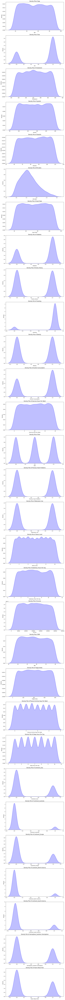

In [200]:
numeric_columns  = df.select_dtypes(include=['number']).columns

plt.figure(figsize=(10,len(numeric_columns)*5))
for i, column in enumerate(numeric_columns,1):
    plt.subplot(len(numeric_columns),1,i)
    sns.kdeplot(df[column], shade=True, color='blue')
    plt.title(f"Density Plot of {column}")
    plt.xlabel(column)
    plt.ylabel('Density')
plt.tight_layout()
plt.show()

Correlation Matrix

In [201]:
df.corr()

,Age,Sex,Cholesterol,Systolic,Diastolic,BP_Ratio,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Continent_Asia,Continent_Australia,Continent_Europe,Continent_North America,Continent_South America,Hemisphere_Southern Hemisphere,Heart Attack Risk
Age,1.000000,0.020067,-0.009107,0.003070,-0.009826,0.004569,-0.003844,-0.014105,0.008353,0.394891,-0.008140,-0.006666,0.001206,-0.013230,0.000868,0.000980,0.018307,0.017280,-0.001733,-0.002612,0.003415,0.001384,-0.002185,0.001214,-0.004135,-0.012305,0.012441,-0.007371,-0.002795,0.006403
Sex,0.020067,1.000000,0.007614,-0.006037,-0.002251,-0.002999,-0.010921,0.003582,0.002180,0.514837,0.002376,0.002085,-0.006976,0.005740,0.001964,-0.007148,-0.021835,0.002995,0.002660,-0.003021,0.002933,-0.007660,-0.005329,0.007993,0.012809,-0.012408,0.005233,-0.015638,-0.003075,0.003095
Cholesterol,-0.009107,0.007614,1.000000,0.000133,0.002083,0.000697,0.000315,-0.013428,-0.021608,0.016342,-0.014843,-0.007261,0.021517,-0.010765,-0.006070,-0.000905,-0.024487,0.018914,0.000007,0.017292,-0.005454,0.016056,0.004456,0.002784,-0.015176,0.004128,0.011559,0.001614,-0.019462,0.019340
Systolic,0.003070,-0.006037,0.000133,1.000000,0.013337,0.726261,0.008482,-0.005306,-0.009762,-0.009534,-0.001918,0.010764,-0.009506,0.013648,-0.011926,-0.001182,0.017848,0.003393,0.010414,0.004279,0.005121,-0.007574,-0.004628,-0.002017,0.008386,-0.004205,0.005589,0.003203,0.003969,0.018585
Diastolic,-0.009826,-0.002251,0.002083,0.013337,1.000000,-0.656297,-0.018113,-0.000512,0.017818,-0.012293,-0.020574,-0.007282,-0.003469,0.005636,0.008813,0.004607,-0.008445,-0.006606,0.008816,0.000806,0.000545,0.016294,0.010679,-0.003701,-0.008030,0.003710,-0.003666,0.014838,0.003961,-0.007509
BP_Ratio,0.004569,-0.002999,0.000697,0.726261,-0.656297,1.000000,0.019231,-0.002366,-0.021332,0.001331,0.016943,0.012758,-0.004592,0.006323,-0.012658,-0.004926,0.014894,0.007299,-0.001043,0.002923,0.000396,-0.017859,-0.008999,0.003869,0.012897,-0.007689,0.004059,-0.010976,0.000530,0.017070
Heart Rate,-0.003844,-0.010921,0.000315,0.008482,-0.018113,0.019231,1.000000,0.006764,-0.013470,-0.012331,0.012725,0.003459,0.008276,-0.003014,-0.004956,0.009244,-0.004547,-0.010232,0.004873,0.005299,0.012244,0.000834,0.001811,-0.011320,0.013217,-0.004921,-0.003223,0.004973,0.010145,-0.004251
Diabetes,-0.014105,0.003582,-0.013428,-0.005306,-0.000512,-0.002366,0.006764,1.000000,-0.013844,0.000527,0.012866,0.005551,-0.007014,0.006156,0.000867,-0.002656,0.006719,0.004705,-0.000759,-0.002852,0.010431,-0.002411,-0.012457,0.004874,-0.013225,0.010008,0.008080,-0.011518,0.001478,0.017225
Family History,0.008353,0.002180,-0.021608,-0.009762,0.017818,-0.021332,-0.013470,-0.013844,1.000000,0.011748,-0.001444,0.012701,-0.006378,-0.001401,-0.004568,0.000981,0.015637,0.002561,-0.000401,-0.011492,-0.001904,0.009561,-0.011199,0.000678,-0.001361,-0.017669,0.024579,0.002242,-0.004163,-0.001652
Smoking,0.394891,0.514837,0.016342,-0.009534,-0.012293,0.001331,-0.012331,0.000527,0.011748,1.000000,0.003969,0.012754,-0.000150,0.006023,-0.000574,-0.010877,-0.001757,0.015311,0.003096,0.007670,0.004650,-0.006465,-0.005424,0.002760,-0.003495,0.004458,-0.009183,-0.008796,0.002439,-0.004051


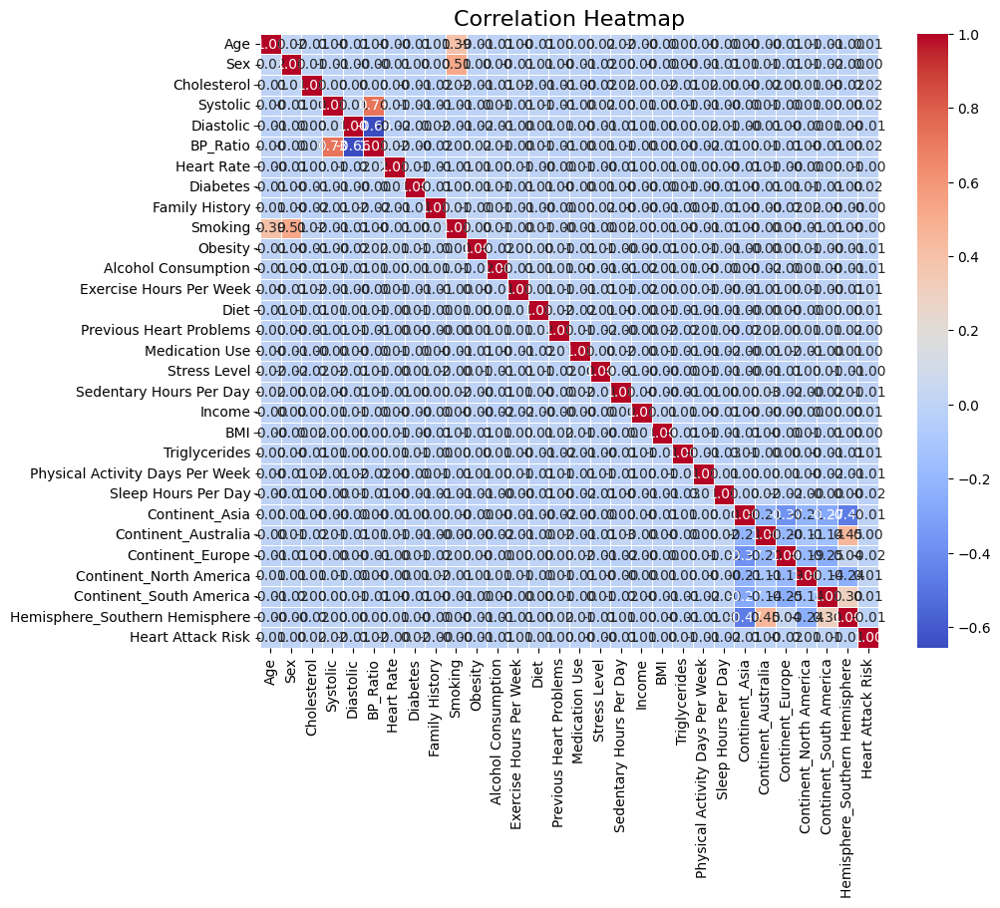

In [205]:
correlation_matrix = df.corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix, annot=True, cmap= 'coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap', fontsize=16)
plt.show()

Feature Corelation By Ranking

In [207]:
correlation_matrix_success = correlation_matrix['Heart Attack Risk']
correlation_ranked = correlation_matrix_success.sort_values(ascending=False)
print(correlation_ranked)



Heart Attack Risk                  1.000000
Cholesterol                        0.019340
Systolic                           0.018585
Diabetes                           0.017225
BP_Ratio                           0.017070
Continent_North America            0.012751
Exercise Hours Per Week            0.011133
Triglycerides                      0.010471
Income                             0.009628
Continent_South America            0.007303
Age                                0.006403
Diet                               0.005908
Sex                                0.003095
Medication Use                     0.002234
Continent_Australia                0.001851
Previous Heart Problems            0.000274
BMI                                0.000020
Family History                    -0.001652
Smoking                           -0.004051
Stress Level                      -0.004111
Heart Rate                        -0.004251
Physical Activity Days Per Week   -0.005014
Sedentary Hours Per Day         

Feature Relationship

In [ ]:
# sns.pairplot(df, diag_kind="kde")
# plt.subplot("Pairwaise Relationships Between Attributes", y=1.02)
# plt.show()

ValueError: Single argument to subplot must be a three-digit integer, not 'Pairwaise Relationships Between Attributes'

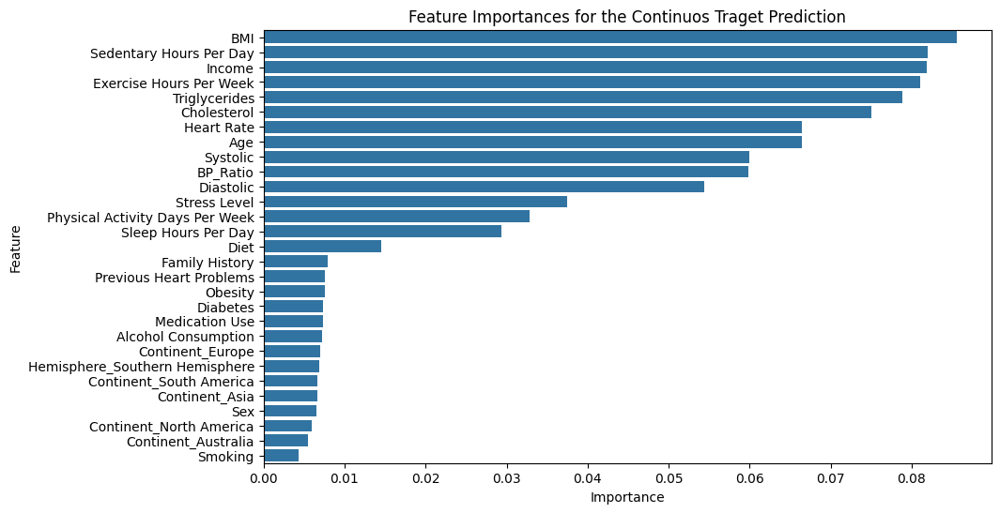

In [212]:
from sklearn.ensemble import RandomForestRegressor

x = df.drop(columns=[df.columns[-1]])
y = df[df.columns[-1]]

rf = RandomForestRegressor()
rf.fit(x,y)
importences = rf.feature_importances_

feature_importances_df = pd.DataFrame({
    'Feature':x.columns,
    'Importance': importences
}).sort_values(by='Importance', ascending=False )

plt.figure(figsize=(10,6))
sns.barplot(data=feature_importances_df, x='Importance', y='Feature')
plt.title('Feature Importances for the Continuos Traget Prediction')
plt.show()


In [215]:
df_top5_importance = feature_importances_df.head(5)

# Create a new DataFrame with only the top 5 features and the target
df_top5_importance = x[df_top5_importance['Feature']].copy()
df_top5_importance['Heart Attack Risk'] = y  # Add the target column

df_top5_importance

,BMI,Sedentary Hours Per Day,Income,Exercise Hours Per Week,Triglycerides,Heart Attack Risk
0,31.251233,6.615001,261404,4.168189,286,0
1,27.194973,4.963459,285768,1.813242,235,0
2,28.176571,9.463426,235282,2.078353,587,0
3,36.464704,7.648981,125640,9.828130,378,0
4,21.809144,1.514821,160555,5.804299,231,0
...,...,...,...,...,...,...
8758,19.655895,10.806373,235420,7.917342,67,0
8759,23.993866,3.833038,217881,16.558426,617,0
8760,35.406146,2.375214,36998,3.148438,527,1
8761,27.294020,0.029104,209943,3.789950,114,0


Feature Selection RFE

In [216]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
rfe = RFE(estimator=model, n_features_to_select=5)
rfe.fit(x,y)
seletected_feature = x.columns[rfe.support_]
print(f"Selected Feature:{seletected_feature}")
print(f"Feature Ranking:{rfe.ranking_}")


c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

Selected Feature:Index(['BP_Ratio', 'Diabetes', 'Continent_Asia', 'Continent_Europe',
       'Hemisphere_Southern Hemisphere'],
      dtype='object')
Feature Ranking:[23 19 21 15 14  1 20  1  9  5  3  2 10  8 16 22 11 12 25 18 24 17  6  1
  7  1  4 13  1]


In [217]:
df_rfe = df[seletected_feature]
df_rfe['Heart Attack Risk'] = y
df_rfe.head()

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\2741146788.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rfe['Heart Attack Risk'] = y


,BP_Ratio,Diabetes,Continent_Asia,Continent_Europe,Hemisphere_Southern Hemisphere,Heart Attack Risk
0,1.80,0,0,0,1,0
1,1.77,1,0,0,0,0
2,1.76,1,0,1,0,0
3,1.63,1,0,0,0,0
4,1.03,1,1,0,0,0


**Feature Scaling**

Min-Max(Baseline Data)

In [222]:
from sklearn.preprocessing import MinMaxScaler
#Convert DataFrame in numpy array
array =df.values
x=  array[:,:-1]
y= array[:,-1]

scaler = MinMaxScaler(feature_range=(0,1))
rescaledx = scaler.fit_transform(x)
#Print 3 rescaled inputs
print(rescaledx[0:3,:])

[[0.68055556 1.         0.31428571 0.75555556 0.56       0.44954128
  0.45714286 0.         0.         1.         0.         0.
  0.20832621 0.5        0.         0.         0.88888889 0.55123442
  0.8622683  0.6023629  0.33246753 0.         0.33333333 0.
  0.         0.         0.         1.         1.        ]
 [0.04166667 1.         0.96071429 0.83333333 0.66       0.43577982
  0.82857143 1.         1.         1.         1.         1.
  0.09055687 0.         1.         0.         0.         0.4135835
  0.94931616 0.4179445  0.26623377 0.14285714 0.5        0.
  0.         0.         1.         0.         0.        ]
 [0.04166667 0.         0.72857143 0.93333333 0.78       0.43119266
  0.45714286 1.         0.         0.         0.         0.
  0.10381491 1.         1.         1.         0.88888889 0.78864169
  0.76893945 0.46257296 0.72337662 0.57142857 0.         0.
  0.         1.         0.         0.         0.        ]]


Min-Max (Feature Importance Data)

In [224]:
array= df_top5_importance.values

x= array[:,:-1]
y=array[:,-1]

scaler = MinMaxScaler(feature_range=(0,1))
rescaledx_top5 = scaler.fit_transform(x)
print(rescaledx_top5[0:5,:])


[[0.6023629  0.55123442 0.8622683  0.20832621 0.33246753]
 [0.4179445  0.4135835  0.94931616 0.09055687 0.26623377]
 [0.46257296 0.78864169 0.76893945 0.10381491 0.72337662]
 [0.8393941  0.63741337 0.37720978 0.49137608 0.45194805]
 [0.17307703 0.12615031 0.50195433 0.29014698 0.26103896]]


Min-Max (RFE)

In [225]:
array= df_rfe.values

x= array[:,:-1]
y=array[:,-1]

scaler = MinMaxScaler(feature_range=(0,1))
rescaledx_rfe = scaler.fit_transform(x)
print(rescaledx_rfe[0:5,:])

[[0.44954128 0.         0.         0.         1.        ]
 [0.43577982 1.         0.         0.         0.        ]
 [0.43119266 1.         0.         1.         0.        ]
 [0.37155963 1.         0.         0.         0.        ]
 [0.09633028 1.         1.         0.         0.        ]]


**Splitting Data to Train and Test**

Baseline Data

In [226]:
import pandas as pd
from sklearn.model_selection import train_test_split

array = df.values

X = rescaledx
y = y

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Feature Importance Data

In [227]:
import pandas as pd
from sklearn.model_selection import train_test_split

array = df.values

X = rescaledx_top5
y = y

# Split data into training and testing sets
X_train_top5, X_test_top5, y_train_top5, y_test_top5 = train_test_split(X, y, test_size=0.3, random_state=42)

RFE data

In [228]:
import pandas as pd
from sklearn.model_selection import train_test_split

array = df.values

X = rescaledx_rfe 
y = y

# Split data into training and testing sets
X_train_rfe, X_test_rfe, y_train_rfe, y_test_rfe = train_test_split(X, y, test_size=0.3, random_state=42)

**Checking for Data Imbalance in Training Data**

Baseline Data

In [229]:
# Convert y_train to pandas Series if it is a NumPy array
y_train_series = pd.Series(y_train)

# Calculate the class distribution in the training data
class_dist_train = y_train_series.value_counts()
print("Class distribution in training data:")
print(class_dist_train)
print()

# Calculate the percentage for each class in the training data
total_samples_train = class_dist_train.sum()
percentages_train = (class_dist_train / total_samples_train) * 100
print("Class Percentages in Training Data:")
print(percentages_train)

Class distribution in training data:
0.0    3933
1.0    2201
Name: count, dtype: int64

Class Percentages in Training Data:
0.0    64.118031
1.0    35.881969
Name: count, dtype: float64


Feature Importance Data

In [230]:
# Convert y_train to pandas Series if it is a NumPy array
y_train_series = pd.Series(y_train_top5)

# Calculate the class distribution in the training data
class_dist_train = y_train_series.value_counts()
print("Class distribution in training data:")
print(class_dist_train)
print()

# Calculate the percentage for each class in the training data
total_samples_train = class_dist_train.sum()
percentages_train = (class_dist_train / total_samples_train) * 100
print("Class Percentages in Training Data:")
print(percentages_train)

Class distribution in training data:
0.0    3933
1.0    2201
Name: count, dtype: int64

Class Percentages in Training Data:
0.0    64.118031
1.0    35.881969
Name: count, dtype: float64


RFE Data

In [231]:
# Convert y_train to pandas Series if it is a NumPy array
y_train_series = pd.Series(y_train_rfe)

# Calculate the class distribution in the training data
class_dist_train = y_train_series.value_counts()
print("Class distribution in training data:")
print(class_dist_train)
print()

# Calculate the percentage for each class in the training data
total_samples_train = class_dist_train.sum()
percentages_train = (class_dist_train / total_samples_train) * 100
print("Class Percentages in Training Data:")
print(percentages_train)

Class distribution in training data:
0.0    3933
1.0    2201
Name: count, dtype: int64

Class Percentages in Training Data:
0.0    64.118031
1.0    35.881969
Name: count, dtype: float64


SMOTE Oversampling for Minority Class

In [232]:
from imblearn.over_sampling import SMOTE

# Convert y_train_top5 and y_train_rfe to pandas Series for easier manipulation
y_train = pd.Series(y_train)
y_train_top5 = pd.Series(y_train_top5)
y_train_rfe = pd.Series(y_train_rfe)

# Display class distribution before oversampling
print('Before Oversampling for X_train:')
print(y_train.value_counts())

print('Before Oversampling for X_train_top5:')
print(y_train_top5.value_counts())

print('Before Oversampling for X_train_rfe:')
print(y_train_rfe.value_counts())

# Apply SMOTE for oversampling on the full training set
smote = SMOTE(random_state=42)

# Oversample X_train, y_train
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Oversample X_train_top5, y_train_top5
X_train_top5_smote, y_train_top5_smote = smote.fit_resample(X_train_top5, y_train_top5)

# Oversample X_train_rfe, y_train_rfe
X_train_rfe_smote, y_train_rfe_smote = smote.fit_resample(X_train_rfe, y_train_rfe)

# Convert y_train_smote, y_train_top5_smote, and y_train_rfe_smote back to pandas Series
y_train_smote = pd.Series(y_train_smote)
y_train_top5_smote = pd.Series(y_train_top5_smote)
y_train_rfe_smote = pd.Series(y_train_rfe_smote)

# Display class distribution after oversampling
print('After Oversampling for X_train:')
print(y_train_smote.value_counts())

print('After Oversampling for X_train_top5:')
print(y_train_top5_smote.value_counts())

print('After Oversampling for X_train_rfe:')
print(y_train_rfe_smote.value_counts())

Before Oversampling for X_train:
0.0    3933
1.0    2201
Name: count, dtype: int64
Before Oversampling for X_train_top5:
0.0    3933
1.0    2201
Name: count, dtype: int64
Before Oversampling for X_train_rfe:
0.0    3933
1.0    2201
Name: count, dtype: int64
After Oversampling for X_train:
0.0    3933
1.0    3933
Name: count, dtype: int64
After Oversampling for X_train_top5:
0.0    3933
1.0    3933
Name: count, dtype: int64
After Oversampling for X_train_rfe:
0.0    3933
1.0    3933
Name: count, dtype: int64


**Supervised Learning**

Train, Test and Evaluate Models

Logistic Regression: Accuracy: 0.497
Classification Report for Logistic Regression:
               precision    recall  f1-score   support

         0.0       0.63      0.51      0.57      1691
         1.0       0.35      0.47      0.40       938

    accuracy                           0.50      2629
   macro avg       0.49      0.49      0.48      2629
weighted avg       0.53      0.50      0.51      2629




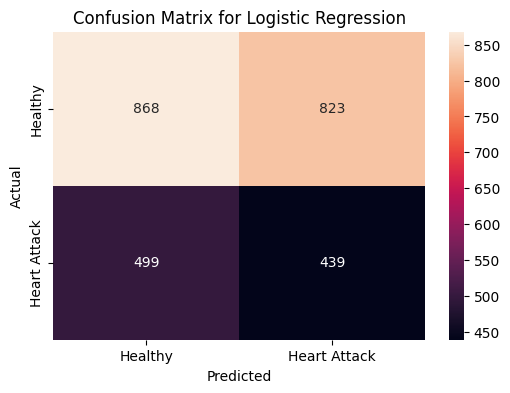

KNN: Accuracy: 0.473
Classification Report for KNN:
               precision    recall  f1-score   support

         0.0       0.63      0.44      0.52      1691
         1.0       0.34      0.53      0.42       938

    accuracy                           0.47      2629
   macro avg       0.49      0.48      0.47      2629
weighted avg       0.53      0.47      0.48      2629




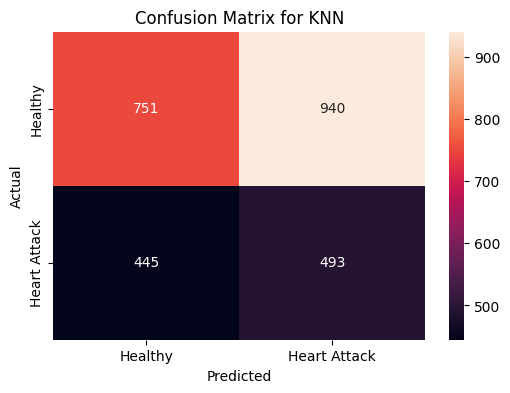

Decision Tree: Accuracy: 0.524
Classification Report for Decision Tree:
               precision    recall  f1-score   support

         0.0       0.64      0.61      0.62      1691
         1.0       0.35      0.37      0.36       938

    accuracy                           0.52      2629
   macro avg       0.49      0.49      0.49      2629
weighted avg       0.53      0.52      0.53      2629




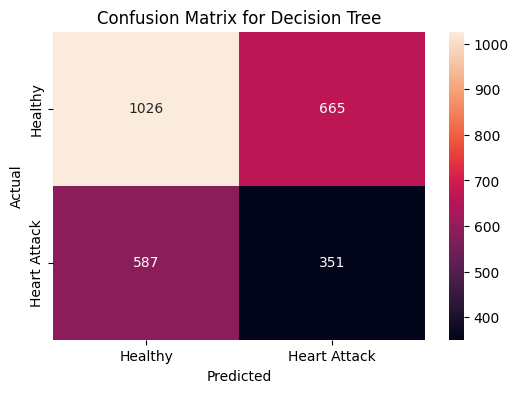

Naive Bayes: Accuracy: 0.509
Classification Report for Naive Bayes:
               precision    recall  f1-score   support

         0.0       0.64      0.55      0.59      1691
         1.0       0.35      0.43      0.38       938

    accuracy                           0.51      2629
   macro avg       0.49      0.49      0.49      2629
weighted avg       0.53      0.51      0.52      2629




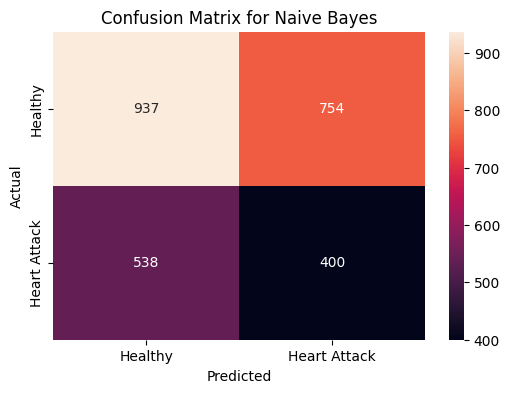

Support Vector Machine: Accuracy: 0.540
Classification Report for Support Vector Machine:
               precision    recall  f1-score   support

         0.0       0.64      0.66      0.65      1691
         1.0       0.35      0.32      0.33       938

    accuracy                           0.54      2629
   macro avg       0.49      0.49      0.49      2629
weighted avg       0.53      0.54      0.54      2629




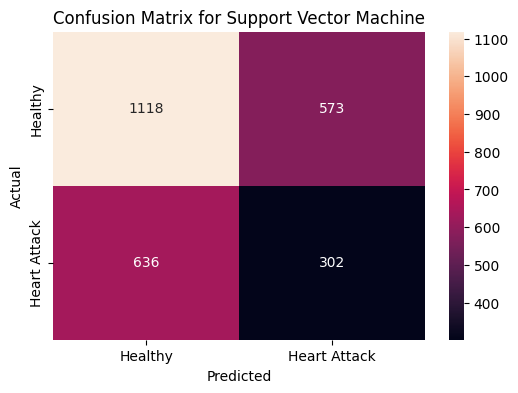

GBM: Accuracy: 0.603
Classification Report for GBM:
               precision    recall  f1-score   support

         0.0       0.64      0.88      0.74      1691
         1.0       0.33      0.11      0.17       938

    accuracy                           0.60      2629
   macro avg       0.49      0.49      0.45      2629
weighted avg       0.53      0.60      0.54      2629




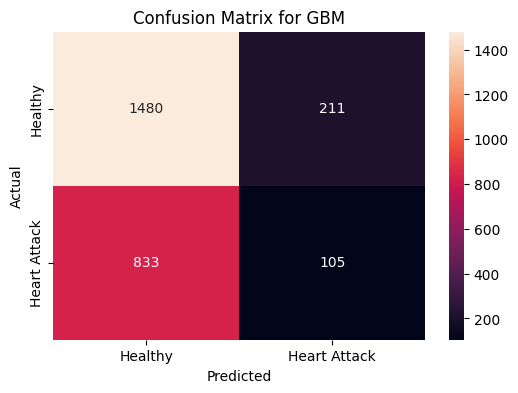

XGBoost: Accuracy: 0.583
Classification Report for XGBoost:
               precision    recall  f1-score   support

         0.0       0.65      0.77      0.70      1691
         1.0       0.37      0.25      0.30       938

    accuracy                           0.58      2629
   macro avg       0.51      0.51      0.50      2629
weighted avg       0.55      0.58      0.56      2629




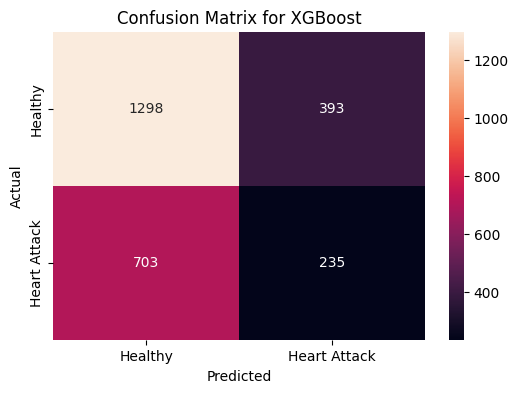

MLP: Accuracy: 0.531
Classification Report for MLP:
               precision    recall  f1-score   support

         0.0       0.63      0.64      0.64      1691
         1.0       0.34      0.34      0.34       938

    accuracy                           0.53      2629
   macro avg       0.49      0.49      0.49      2629
weighted avg       0.53      0.53      0.53      2629




c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


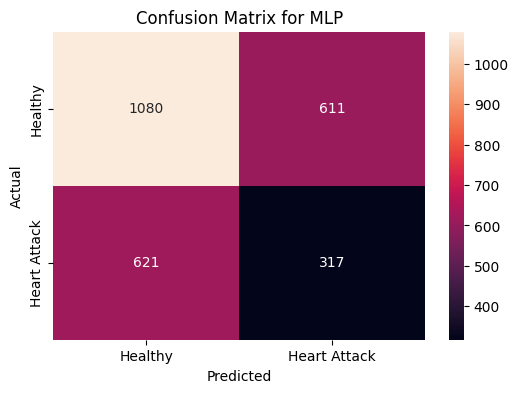

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\2826009044.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=names, y=results, palette='viridis')


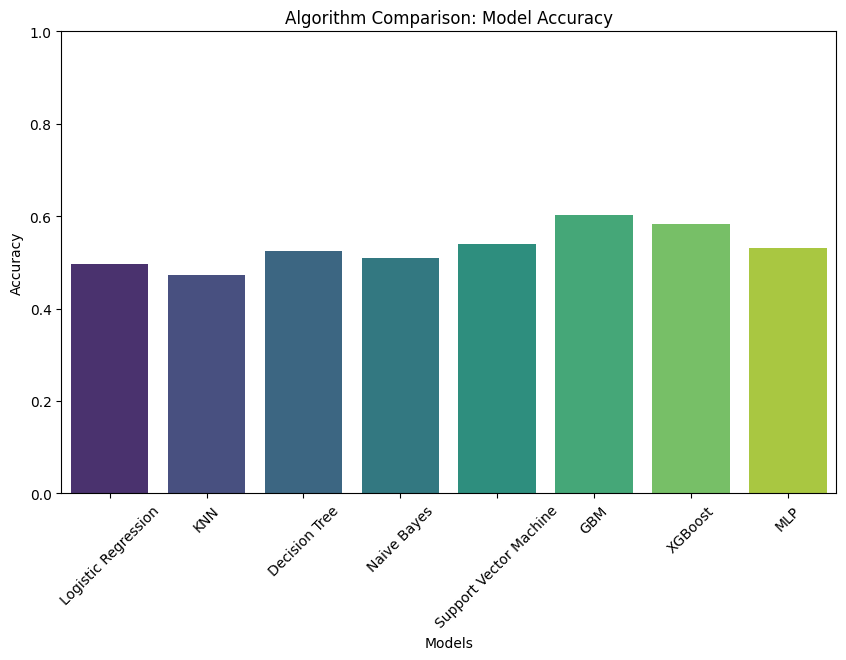

In [233]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score

# Prepare models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Support Vector Machine', SVC()),
    ('GBM', GradientBoostingClassifier()),
    ('XGBoost', xgb.XGBClassifier(eval_metric='mlogloss')),
    ('MLP', MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500))
]

# Prepare lists to store results and names
results = []
names = []

# Evaluate each model in turn
for name, model in models:
    # Train the model using training data (SMOTE for handling imbalance)
    model.fit(X_train_smote, y_train_smote)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Accuracy score
    accuracy = model.score(X_test, y_test)
    results.append(accuracy)
    names.append(name)
    print(f"{name}: Accuracy: {accuracy:.3f}")
    
    # Classification report
    print(f"Classification Report for {name}:\n", classification_report(y_test, y_pred))
    print()

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", 
                xticklabels=['Healthy', 'Heart Attack'], 
                yticklabels=['Healthy', 'Heart Attack'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Bar plot for algorithm comparison (accuracies of models)
plt.figure(figsize=(10, 6))
sns.barplot(x=names, y=results, palette='viridis')
plt.title('Algorithm Comparison: Model Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Limiting y-axis from 0 to 1 for accuracy percentage
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

Feature Importance Data

Logistic Regression: Accuracy: 0.493
Classification Report for Logistic Regression:
               precision    recall  f1-score   support

         0.0       0.64      0.48      0.55      1691
         1.0       0.35      0.51      0.42       938

    accuracy                           0.49      2629
   macro avg       0.50      0.50      0.48      2629
weighted avg       0.54      0.49      0.50      2629




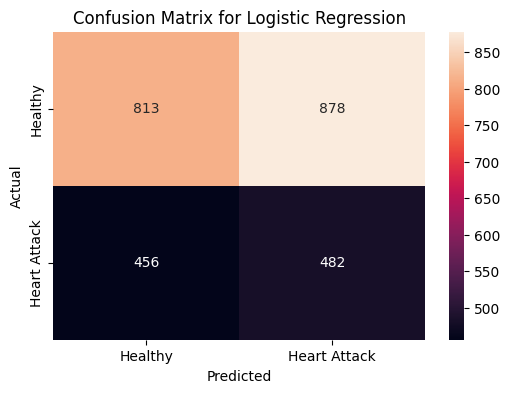

KNN: Accuracy: 0.496
Classification Report for KNN:
               precision    recall  f1-score   support

         0.0       0.63      0.52      0.57      1691
         1.0       0.34      0.45      0.39       938

    accuracy                           0.50      2629
   macro avg       0.49      0.49      0.48      2629
weighted avg       0.53      0.50      0.51      2629




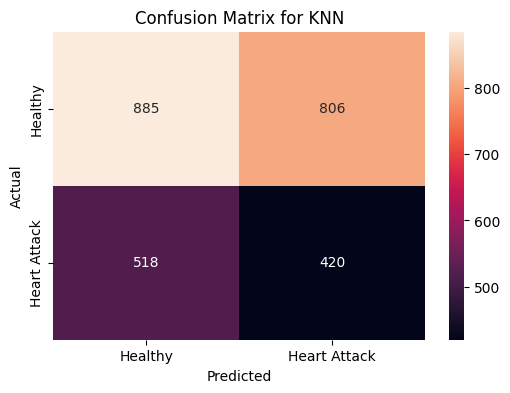

Decision Tree: Accuracy: 0.521
Classification Report for Decision Tree:
               precision    recall  f1-score   support

         0.0       0.64      0.57      0.61      1691
         1.0       0.36      0.43      0.39       938

    accuracy                           0.52      2629
   macro avg       0.50      0.50      0.50      2629
weighted avg       0.54      0.52      0.53      2629




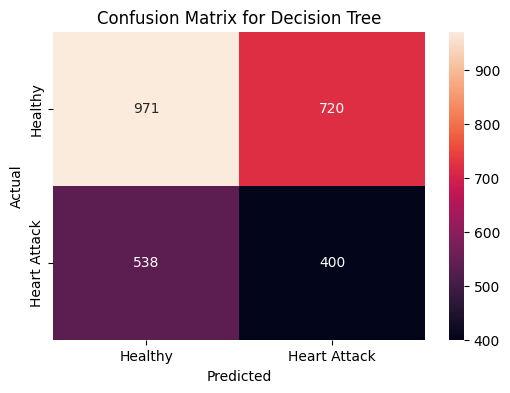

Naive Bayes: Accuracy: 0.484
Classification Report for Naive Bayes:
               precision    recall  f1-score   support

         0.0       0.63      0.47      0.54      1691
         1.0       0.35      0.51      0.41       938

    accuracy                           0.48      2629
   macro avg       0.49      0.49      0.48      2629
weighted avg       0.53      0.48      0.49      2629




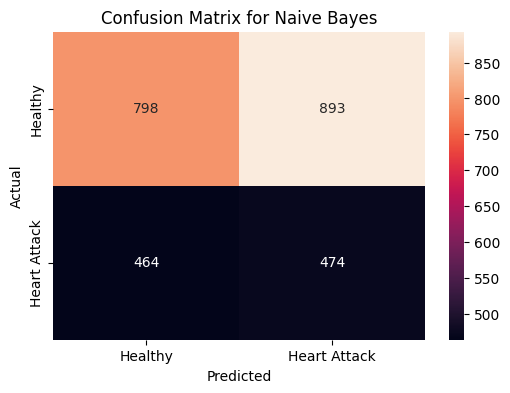

Support Vector Machine: Accuracy: 0.514
Classification Report for Support Vector Machine:
               precision    recall  f1-score   support

         0.0       0.65      0.53      0.59      1691
         1.0       0.36      0.48      0.41       938

    accuracy                           0.51      2629
   macro avg       0.51      0.51      0.50      2629
weighted avg       0.55      0.51      0.52      2629




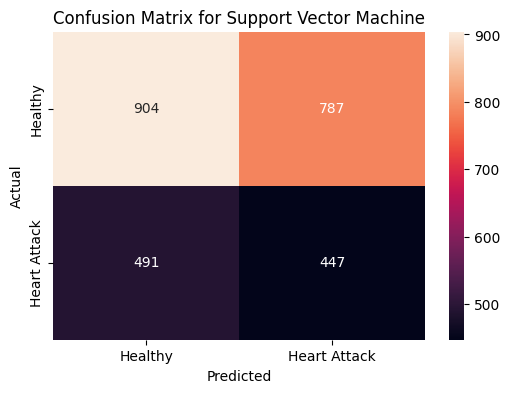

GBM: Accuracy: 0.498
Classification Report for GBM:
               precision    recall  f1-score   support

         0.0       0.65      0.46      0.54      1691
         1.0       0.37      0.56      0.44       938

    accuracy                           0.50      2629
   macro avg       0.51      0.51      0.49      2629
weighted avg       0.55      0.50      0.51      2629




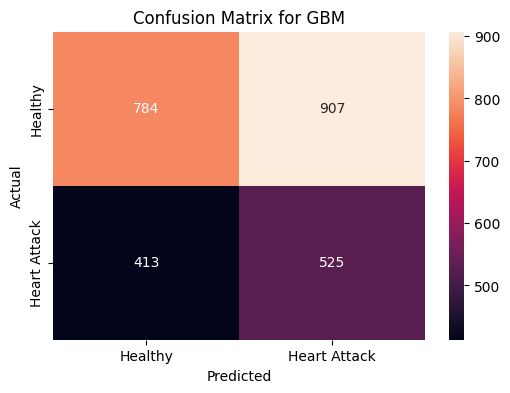

XGBoost: Accuracy: 0.521
Classification Report for XGBoost:
               precision    recall  f1-score   support

         0.0       0.64      0.57      0.61      1691
         1.0       0.36      0.43      0.39       938

    accuracy                           0.52      2629
   macro avg       0.50      0.50      0.50      2629
weighted avg       0.54      0.52      0.53      2629




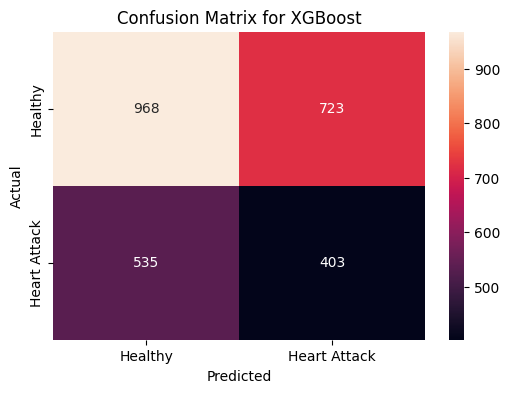

MLP: Accuracy: 0.503
Classification Report for MLP:
               precision    recall  f1-score   support

         0.0       0.64      0.52      0.58      1691
         1.0       0.35      0.47      0.40       938

    accuracy                           0.50      2629
   macro avg       0.50      0.50      0.49      2629
weighted avg       0.54      0.50      0.51      2629




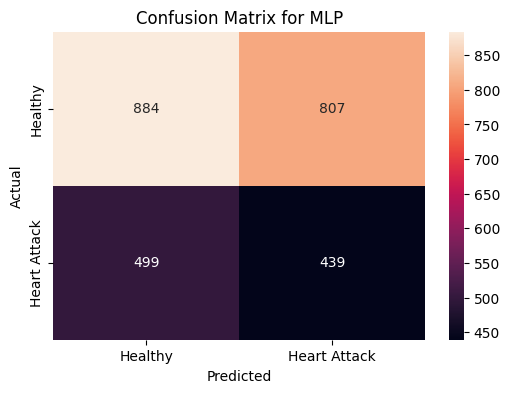

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\1845386343.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=names, y=results, palette='viridis')


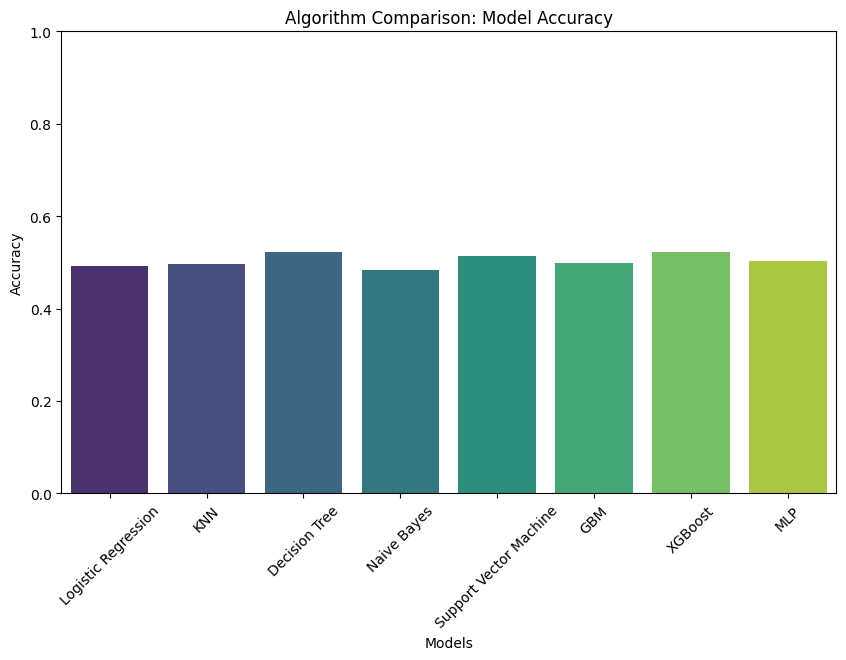

In [236]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score

# Prepare models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Support Vector Machine', SVC()),
    ('GBM', GradientBoostingClassifier()),
    ('XGBoost', xgb.XGBClassifier(eval_metric='mlogloss')),
    ('MLP', MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500))
]

# Prepare lists to store results and names
results = []
names = []

# Evaluate each model in turn
for name, model in models:
    # Train the model using training data (SMOTE for handling imbalance)
    model.fit(X_train_top5_smote, y_train_top5_smote)

    # Predict on the test set
    y_pred = model.predict(X_test_top5)

    # Accuracy score
    accuracy = model.score(X_test_top5, y_test_top5)
    results.append(accuracy)
    names.append(name)
    print(f"{name}: Accuracy: {accuracy:.3f}")
    
    # Classification report
    print(f"Classification Report for {name}:\n", classification_report(y_test, y_pred))
    print()

    # Confusion matrix
    cm = confusion_matrix(y_test_top5, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", 
                xticklabels=['Healthy', 'Heart Attack'], 
                yticklabels=['Healthy', 'Heart Attack'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Bar plot for algorithm comparison (accuracies of models)
plt.figure(figsize=(10, 6))
sns.barplot(x=names, y=results, palette='viridis')
plt.title('Algorithm Comparison: Model Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Limiting y-axis from 0 to 1 for accuracy percentage
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

RFE Data

Logistic Regression: Accuracy: 0.643
Classification Report for Logistic Regression:
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78      1691
         1.0       0.00      0.00      0.00       938

    accuracy                           0.64      2629
   macro avg       0.32      0.50      0.39      2629
weighted avg       0.41      0.64      0.50      2629




c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

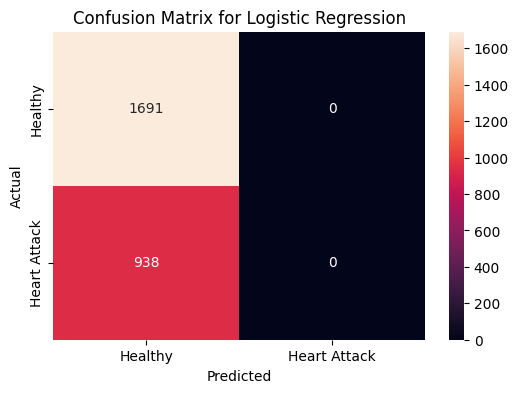

KNN: Accuracy: 0.573
Classification Report for KNN:
               precision    recall  f1-score   support

         0.0       0.65      0.74      0.69      1691
         1.0       0.37      0.27      0.31       938

    accuracy                           0.57      2629
   macro avg       0.51      0.51      0.50      2629
weighted avg       0.55      0.57      0.56      2629




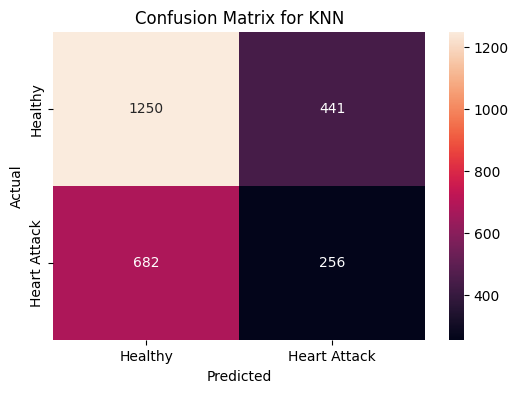

Decision Tree: Accuracy: 0.585
Classification Report for Decision Tree:
               precision    recall  f1-score   support

         0.0       0.64      0.79      0.71      1691
         1.0       0.36      0.22      0.27       938

    accuracy                           0.59      2629
   macro avg       0.50      0.50      0.49      2629
weighted avg       0.54      0.59      0.55      2629




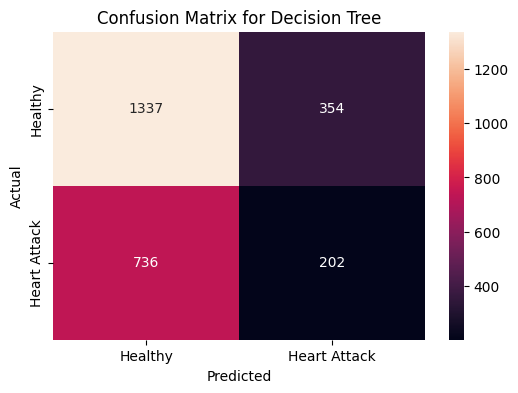

Naive Bayes: Accuracy: 0.643
Classification Report for Naive Bayes:
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78      1691
         1.0       0.00      0.00      0.00       938

    accuracy                           0.64      2629
   macro avg       0.32      0.50      0.39      2629
weighted avg       0.41      0.64      0.50      2629




c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

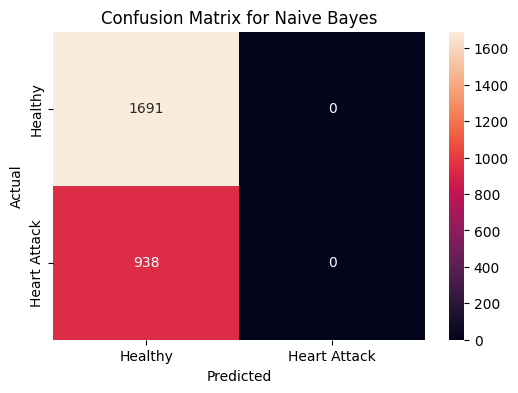

Support Vector Machine: Accuracy: 0.643
Classification Report for Support Vector Machine:
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78      1691
         1.0       0.00      0.00      0.00       938

    accuracy                           0.64      2629
   macro avg       0.32      0.50      0.39      2629
weighted avg       0.41      0.64      0.50      2629




c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

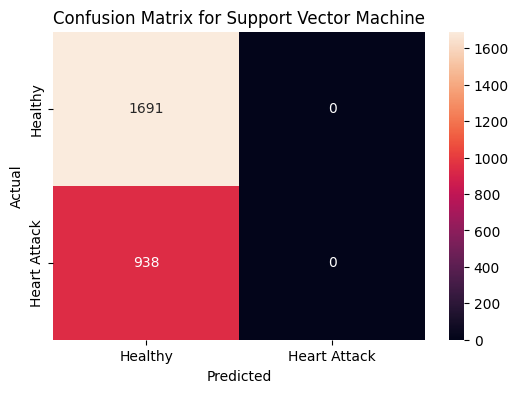

GBM: Accuracy: 0.641
Classification Report for GBM:
               precision    recall  f1-score   support

         0.0       0.64      0.99      0.78      1691
         1.0       0.35      0.01      0.01       938

    accuracy                           0.64      2629
   macro avg       0.50      0.50      0.40      2629
weighted avg       0.54      0.64      0.51      2629




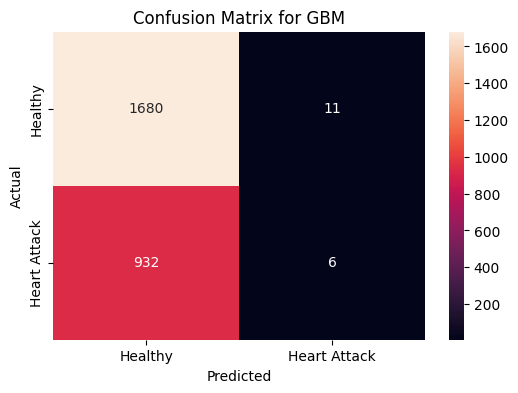

XGBoost: Accuracy: 0.615
Classification Report for XGBoost:
               precision    recall  f1-score   support

         0.0       0.64      0.90      0.75      1691
         1.0       0.36      0.10      0.16       938

    accuracy                           0.61      2629
   macro avg       0.50      0.50      0.46      2629
weighted avg       0.54      0.61      0.54      2629




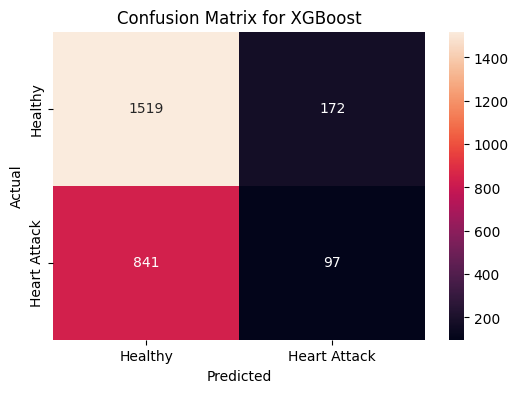

MLP: Accuracy: 0.643
Classification Report for MLP:
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78      1691
         1.0       0.00      0.00      0.00       938

    accuracy                           0.64      2629
   macro avg       0.32      0.50      0.39      2629
weighted avg       0.41      0.64      0.50      2629




c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\atikb\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

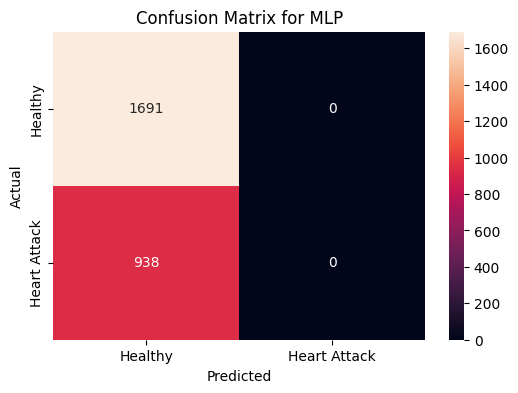

C:\Users\atikb\AppData\Local\Temp\ipykernel_34792\1166509781.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=names, y=results, palette='viridis')


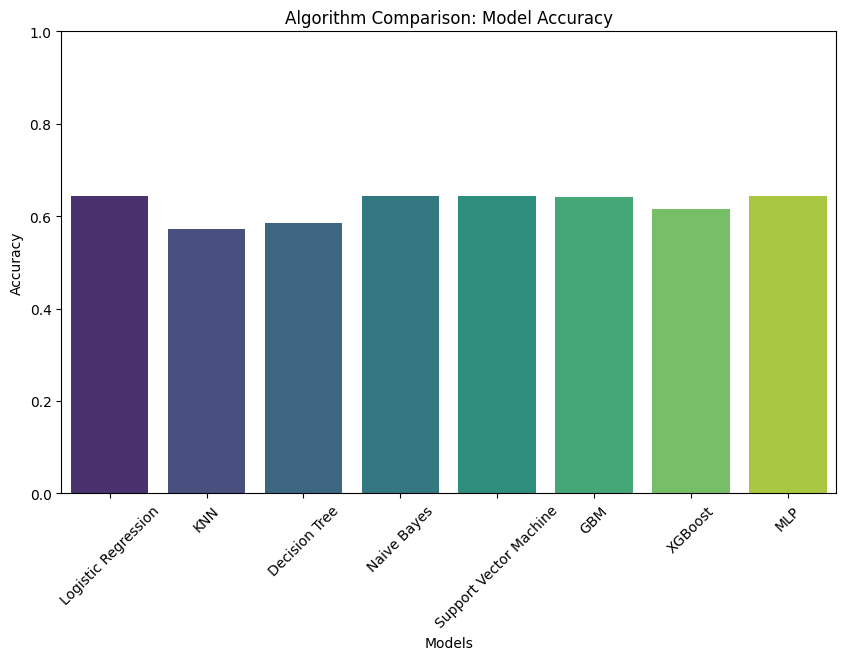

In [237]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score

# Prepare models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Support Vector Machine', SVC()),
    ('GBM', GradientBoostingClassifier()),
    ('XGBoost', xgb.XGBClassifier(eval_metric='mlogloss')),
    ('MLP', MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500))
]

# Prepare lists to store results and names
results = []
names = []

# Evaluate each model in turn
for name, model in models:
    # Train the model using training data (SMOTE for handling imbalance)
    model.fit(X_train_rfe, y_train_rfe)

    # Predict on the test set
    y_pred = model.predict(X_test_rfe)

    # Accuracy score
    accuracy = model.score(X_test_rfe, y_test_rfe)
    results.append(accuracy)
    names.append(name)
    print(f"{name}: Accuracy: {accuracy:.3f}")
    
    # Classification report
    print(f"Classification Report for {name}:\n", classification_report(y_test, y_pred))
    print()

    # Confusion matrix
    cm = confusion_matrix(y_test_rfe, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", 
                xticklabels=['Healthy', 'Heart Attack'], 
                yticklabels=['Healthy', 'Heart Attack'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Bar plot for algorithm comparison (accuracies of models)
plt.figure(figsize=(10, 6))
sns.barplot(x=names, y=results, palette='viridis')
plt.title('Algorithm Comparison: Model Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Limiting y-axis from 0 to 1 for accuracy percentage
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

**Prediction Output**

Baseline Data

In [238]:
test_predictions = {}

# Loop through each model to train and make predictions
for name, model in models:
    # Train the model
    model.fit(X_train_smote, y_train_smote)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Store predictions in the dictionary
    test_predictions[name] = y_pred

# Convert the predictions dictionary into a DataFrame
predictions_df = pd.DataFrame(test_predictions)

# Add the actual values for comparison
predictions_df['Actual'] = y_test

# Reorder the columns to put the 'Actual' value in the first column
predictions_df = predictions_df[['Actual'] + [col for col in predictions_df.columns if col != 'Actual']]

# Mapping to rename class labels
label_mapping = {0: 'Healthy', 1: 'Heart Attack'}

# Rename the values in the DataFrame using the mapping
predictions_df = predictions_df.replace(label_mapping)

# Display the predictions DataFrame
print("Table of Predictions:")
predictions_df

Table of Predictions:


,Actual,Logistic Regression,KNN,Decision Tree,Naive Bayes,Support Vector Machine,GBM,XGBoost,MLP
0,Healthy,Heart Attack,Heart Attack,Healthy,Heart Attack,Healthy,Healthy,Healthy,Heart Attack
1,Heart Attack,Heart Attack,Heart Attack,Heart Attack,Heart Attack,Heart Attack,Heart Attack,Healthy,Heart Attack
2,Heart Attack,Heart Attack,Healthy,Heart Attack,Heart Attack,Healthy,Heart Attack,Healthy,Healthy
3,Heart Attack,Healthy,Healthy,Heart Attack,Heart Attack,Heart Attack,Healthy,Healthy,Healthy
4,Healthy,Healthy,Healthy,Healthy,Healthy,Healthy,Healthy,Healthy,Healthy
...,...,...,...,...,...,...,...,...,...
2624,Heart Attack,Healthy,Heart Attack,Healthy,Healthy,Healthy,Healthy,Healthy,Healthy
2625,Heart Attack,Heart Attack,Heart Attack,Heart Attack,Healthy,Healthy,Healthy,Healthy,Heart Attack
2626,Heart Attack,Healthy,Healthy,Healthy,Healthy,Heart Attack,Healthy,Healthy,Heart Attack
2627,Healthy,Heart Attack,Healthy,Healthy,Heart Attack,Healthy,Healthy,Healthy,Heart Attack
